In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import networkx as nx
import seaborn as sns
import numpy as np

In [2]:
DATA_PATH = Path() / "../data"
#DATA_PATH = Path('/content/gdrive/My Drive/Colab Notebooks/VC_data_Cleaning_With_LLM/data')
DATA_PATH.mkdir(parents=True,exist_ok=True)

def load_csv(filename, data_path=DATA_PATH,encoding='ISO-8859-1'):
    csv_path = data_path / filename
    return pd.read_csv(csv_path,encoding=encoding)

def save_csv(data, filename, data_path=DATA_PATH,encoding='ISO-8859-1'):
    csv_path = data_path / filename
    data.to_csv(csv_path, index=False,encoding='ISO-8859-1')

def load_excel(filename, data_path=DATA_PATH):
    csv_path = data_path / filename
    return pd.read_excel(csv_path)

PLOT_PATH = Path() / "../plot"
#PLOT_PATH = Path('/content/gdrive/My Drive/Colab Notebooks/VC_data_Cleaning_With_LLM/plot')
PLOT_PATH.mkdir(parents=True,exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300, transparent=True):
    path = PLOT_PATH / f"{fig_id}.{fig_extension}"
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution, transparent=transparent)

RESULT_PATH = Path() / "../result"
#PLOT_PATH = Path('/content/gdrive/My Drive/Colab Notebooks/VC_data_Cleaning_With_LLM/plot')
RESULT_PATH.mkdir(parents=True,exist_ok=True)
def save_result(data, filename, data_path=RESULT_PATH):
    csv_path = data_path / filename
    data.to_csv(csv_path, index=False, encoding='utf-8-sig')

def save_excel(data, filename, data_path=RESULT_PATH):
    csv_path = data_path / filename
    data.to_excel(csv_path, index=False)


In [3]:
data = load_excel('final_dataset.xlsx')

### Reformat

In [4]:
data.columns

Index(['profileUrl', 'screenName_fo', 'userId_fo', 'name_fo', 'imgUrl_fo',
       'bio_fo', 'website_fo', 'location', 'location_cleansed', 'createdAt_fo',
       'followersCount_fo', 'friendsCount_fo', 'tweetsCount_fo',
       'certified_fo', 'following_fo', 'followedBy_fo', 'timestamp_fo',
       'row_id', 'if personal account', 'Position', 'Organization',
       'ai_related', 'Frequency', 'Include?', 'position_categorized',
       'highest_level_org', 'screenName_kol', 'userId_kol', 'name_kol',
       'imgUrl_kol', 'bio_kol', 'website_kol', 'location_kol', 'createdAt_kol',
       'followersCount_kol', 'friendsCount_kol', 'tweetsCount_kol',
       'certified_kol'],
      dtype='object')

In [5]:
KOL_list = data['name_kol'].drop_duplicates().reset_index(drop = True).to_list()
KOL_list

['Elon Musk',
 'Yann LeCun',
 'Andrej Karpathy',
 'Andrew Ng',
 'Mustafa Suleyman',
 'Ian Goodfellow',
 'Fei-Fei Li',
 'Demis Hassabis',
 'Sam Altman',
 'Kai-Fu Lee',
 'Russ Salakhutdinov',
 'Geoffrey Hinton',
 'Greg Brockman',
 'Daphne Koller',
 'Ilya Sutskever',
 nan]

In [6]:
data[data['name_kol'].isna()]

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,name_kol,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
3641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pittsburgh,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
data_cleaned = data.dropna(subset=['name_kol'])
len(data_cleaned)

3641

In [8]:
reformat_data = data_cleaned[['screenName_kol', 'userId_kol', 'name_kol',
       'imgUrl_kol', 'bio_kol', 'website_kol', 'location_kol', 'createdAt_kol',
       'followersCount_kol', 'friendsCount_kol', 'tweetsCount_kol',
       'screenName_fo', 'userId_fo', 'name_fo', 'imgUrl_fo',
       'bio_fo', 'website_fo', 'location', 'location_cleansed', 'createdAt_fo',
       'followersCount_fo', 'friendsCount_fo', 'tweetsCount_fo',
       'certified_fo', 'timestamp_fo', 'if personal account', 'Position', 'Organization',
       'ai_related', 'position_categorized', 'highest_level_org',
       'following_fo'
       # 'Frequency', 'Include?', 'row_id', 
       ]]

In [9]:
reformat_data.head()

,screenName_kol,userId_kol,name_kol,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,...,tweetsCount_fo,certified_fo,timestamp_fo,if personal account,Position,Organization,ai_related,position_categorized,highest_level_org,following_fo
0,elonmusk,44196397.0,Elon Musk,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,...,3929.0,1.0,2024-04-08T01:47:01.053Z,N,NaN,NaN,N,NaN,NaN,NaN
1,elonmusk,44196397.0,Elon Musk,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,...,27269.0,0.0,2024-04-08T01:47:00.079Z,N,NaN,NaN,N,NaN,NaN,NaN
2,elonmusk,44196397.0,Elon Musk,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,...,10595.0,1.0,2024-04-08T01:46:59.012Z,N,NaN,NaN,N,NaN,NaN,NaN
3,ylecun,48008938.0,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,...,10639.0,0.0,2024-04-08T01:52:48.750Z,Y,researcher,Google DeepMind,Y,Researcher & Scientist,Google,NaN
4,karpathy,33836629.0,Andrej Karpathy,https://pbs.twimg.com/profile_images/129666729...,"🧑‍🍳. Previously Director of AI @ Tesla, foundi...",karpathy.ai,Stanford,Tue Apr 21 06:49:15 +0000 2009,962447.0,898.0,...,10639.0,0.0,2024-04-08T02:08:28.525Z,Y,researcher,Google DeepMind,Y,Researcher & Scientist,Google,NaN


In [10]:
reformat_data['following_fo'] = reformat_data['following_fo'].fillna(0)

/var/folders/wf/2r4hslkn0cv6g5b9rp14lh240000gn/T/ipykernel_32001/965732538.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reformat_data['following_fo'] = reformat_data['following_fo'].fillna(0)


In [11]:
reformat_data['following_fo'].value_counts()

following_fo
0.0    3488
1.0     153
Name: count, dtype: int64

In [12]:
# reformat_data.head()

In [13]:
kol_pos = load_excel('../data/kol_position.xlsx')
# kol_pos

data_cleaned2 = pd.merge(data_cleaned, kol_pos[['userId_kol', 'position_categorized_kol', 'highest_level_org_kol']], 
                         left_on='userId_kol', right_on='userId_kol', how='left')
data_cleaned2

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol,position_categorized_kol,highest_level_org_kol
0,https://twitter.com/wonderofscience,wonderofscience,3.101589e+09,Wonder of Science,https://pbs.twimg.com/profile_images/104644161...,"""The most beautiful thing we can experience is...",linktr.ee/wonderofscience,üöÄ,NaN,Sat Mar 21 12:29:37 +0000 2015,...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0,Founder & Executive,Tesla
1,https://twitter.com/WallStreetSilv,WallStreetSilv,1.366566e+18,Wall Street Silver,https://pbs.twimg.com/profile_images/148217996...,"Finance, economics, news, memes and silver. Co...",linktr.ee/wssilver,üëâ,NaN,Tue Mar 02 01:47:11 +0000 2021,...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0,Founder & Executive,Tesla
2,https://twitter.com/AMAZlNGNATURE,AMAZlNGNATURE,2.828213e+09,Nature is Amazing,https://pbs.twimg.com/profile_images/992795937...,Animals Nature Discovery,NaN,üåç,NaN,Tue Sep 23 15:27:26 +0000 2014,...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0,Founder & Executive,Tesla
3,https://twitter.com/giffmana,giffmana,2.236048e+09,Lucas Beyer (bl16),https://pbs.twimg.com/profile_images/378800000...,"Researcher (Google DeepMind/Brain in Zrich, ex...",lucasb.eyer.be,"Z√ºrich, Suisse",Suisse,Sun Dec 08 13:31:09 +0000 2013,...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0,Researcher & Scientist,Meta
4,https://twitter.com/giffmana,giffmana,2.236048e+09,Lucas Beyer (bl16),https://pbs.twimg.com/profile_images/378800000...,"Researcher (Google DeepMind/Brain in Zrich, ex...",lucasb.eyer.be,"Z√ºrich, Suisse",Suisse,Sun Dec 08 13:31:09 +0000 2013,...,"🧑‍🍳. Previously Director of AI @ Tesla, foundi...",karpathy.ai,Stanford,Tue Apr 21 06:49:15 +0000 2009,962447.0,898.0,8617.0,1.0,Founder & Executive,OpenAI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3636,https://twitter.com/OpenAI,OpenAI,4.398626e+09,OpenAI,https://pbs.twimg.com/profile_images/163405803...,OpenAIs mission is to ensure that artificial g...,openai.com,NaN,NaN,Sun Dec 06 22:51:08 +0000 2015,...,Co-Founder of Coursera; Stanford CS adjunct fa...,andrewng.org,"Palo Alto, CA",Thu Nov 18 03:39:11 +0000 2010,1003468.0,902.0,1666.0,1.0,Founder & Executive,Coursera
3637,https://twitter.com/midjourney,midjourney,1.307056e+18,Midjourney,https://pbs.twimg.com/profile_images/150007894...,New research lab. Exploring new mediums of tho...,midjourney.com,NaN,NaN,Fri Sep 18 20:38:07 +0000 2020,...,Co-Founder of Coursera; Stanford CS adjunct fa...,andrewng.org,"Palo Alto, CA",Thu Nov 18 03:39:11 +0000 2010,1003468.0,902.0,1666.0,1.0,Founder & Executive,Coursera
3638,https://twitter.com/OpenAIDevs,OpenAIDevs,1.633875e+18,OpenAI Developers,https://pbs.twimg.com/profile_images/172059874...,Official @OpenAI account for anyone building o...,platform.openai.com,NaN,NaN,Thu Mar 09 16:58:51 +0000 2023,...,Co-Founder of Coursera; Stanford CS adjunct fa...,andrewng.org,"Palo Alto, CA",Thu Nov 18 03:39:11 +0000 2010,1003468.0,902.0,1666.0,1.0,Founder & Executive,Coursera
3639,https://twitter.com/hsu_steve,hsu_steve,1.610781e+08,steve hsu,https://pbs.twimg.com/profile_images/237384547...,"physicist, startup founder, blogger, dad",infoproc.blogspot.com,NaN,NaN,Tue Jun 29 23:02:37 +0000 2010,...,Co-Founder of Coursera; Stanford CS adjunct fa...,andrewng.org,"Palo Alto, CA",Thu Nov 18 03:39:11 +0000 2010,1003468.0,902.0,1666.0,1.0,Founder & Executive,Coursera


### EDA

#### followings point to influencer

Saving figure network_graph1


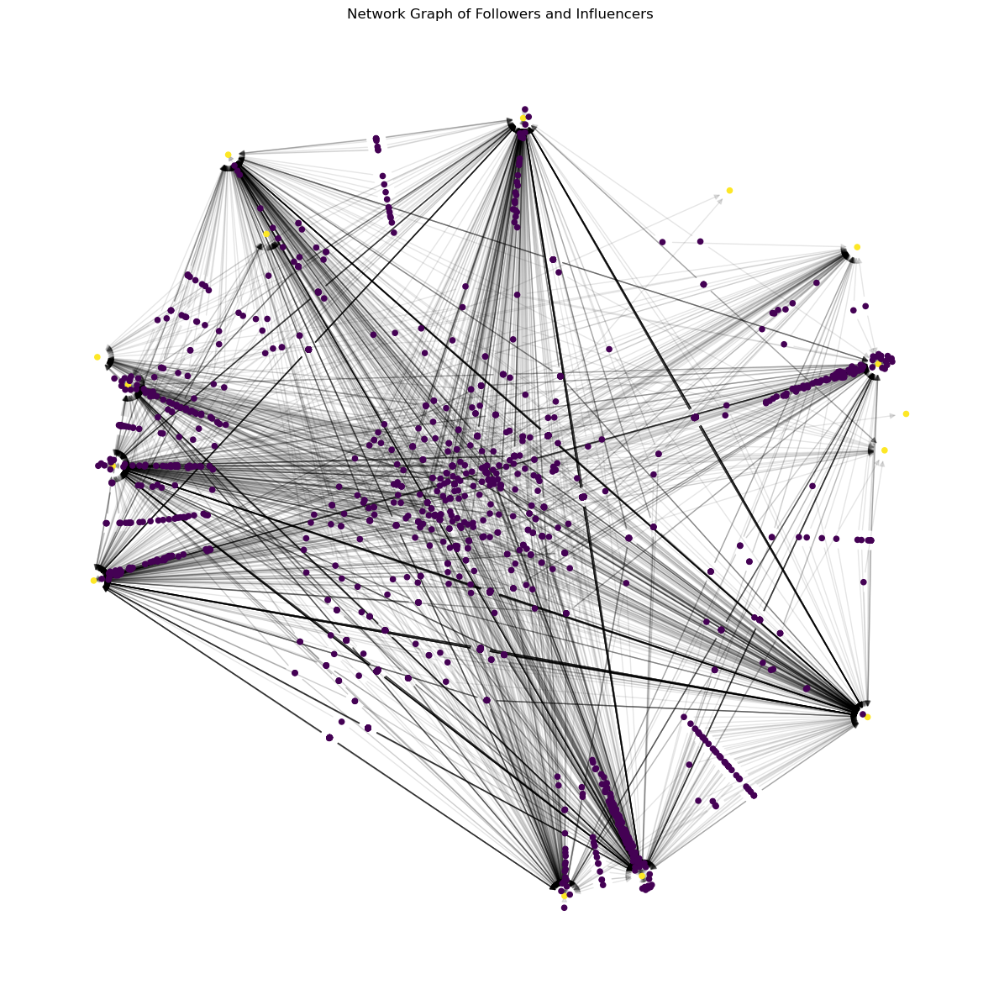

In [14]:
# Create a directed graph
G1 = nx.DiGraph()

# Adding nodes and edges from the dataset
# We use name_fo for follower nodes and screenName_kol for influencer nodes
for _, row in data_cleaned[['name_fo', 'screenName_kol']].dropna().iterrows():
    G1.add_node(row['name_fo'], type='follower')
    G1.add_node(row['screenName_kol'], type='influencer')
    G1.add_edge(row['name_fo'], row['screenName_kol'])

# Visualizing the network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G1, seed=42)  # Positions for all nodes
nx.draw_networkx_nodes(G1, pos, node_size=20, node_color=[G1.nodes[n]['type'] == 'influencer' for n in G1])
nx.draw_networkx_edges(G1, pos, alpha=0.1)
plt.title('Network Graph of Followers and Influencers')
plt.axis('off')  # Turn off the axis
save_fig('network_graph1')
plt.show()

In [15]:
# Calculate network metrics
degree_centrality = nx.degree_centrality(G1)
in_degree_centrality = nx.in_degree_centrality(G1)
out_degree_centrality = nx.out_degree_centrality(G1)
betweenness_centrality = nx.betweenness_centrality(G1)
eigenvector_centrality = nx.eigenvector_centrality_numpy(G1)
clossness_centrality = nx.closeness_centrality(G1)

# Prepare the data for display
centrality_measures1 = pd.DataFrame({
    'Degree Centrality': degree_centrality,
    'In-Degree Centrality': in_degree_centrality,
    'Out-Degree Centrality': out_degree_centrality,
    'Betweenness Centrality': betweenness_centrality,
    'Eigenvector Centrality': eigenvector_centrality,
    'Closeness Centrality': clossness_centrality
})

In [16]:
# Display the top 20 nodes by in-degree centrality
top20_nodes_by_in_degree = centrality_measures1.sort_values(by='In-Degree Centrality', ascending=False).head(20)
top20_nodes_by_in_degree

,Degree Centrality,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Eigenvector Centrality,Closeness Centrality
drfeifei,0.371056,0.371056,0.000000,0.0,-6.277565e-02,0.371056
AndrewYNg,0.310014,0.310014,0.000000,0.0,7.114405e-01,0.310014
karpathy,0.305213,0.305213,0.000000,0.0,-4.198025e-01,0.305213
goodfellow_ian,0.285322,0.285322,0.000000,0.0,2.540466e-01,0.285322
sama,0.277778,0.277778,0.000000,0.0,2.915214e-01,0.277778
ylecun,0.240055,0.240055,0.000000,0.0,-2.669193e-01,0.240055
mustafasuleyman,0.193416,0.193416,0.000000,0.0,1.912634e-01,0.193416
elonmusk,0.172154,0.172154,0.000000,0.0,-2.563575e-02,0.172154
kaifulee,0.160494,0.160494,0.000000,0.0,-1.667806e-02,0.160494
rsalakhu,0.060357,0.060357,0.000000,0.0,1.110990e-01,0.060357


In [17]:
top50_nodes_by_in_degree = centrality_measures1.sort_values(by='In-Degree Centrality', ascending=False).head(50)
top50_nodes_by_in_degree

,Degree Centrality,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Eigenvector Centrality,Closeness Centrality
drfeifei,0.371056,0.371056,0.000000,0.0,-6.277565e-02,0.371056
AndrewYNg,0.310014,0.310014,0.000000,0.0,7.114405e-01,0.310014
karpathy,0.305213,0.305213,0.000000,0.0,-4.198025e-01,0.305213
goodfellow_ian,0.285322,0.285322,0.000000,0.0,2.540466e-01,0.285322
sama,0.277778,0.277778,0.000000,0.0,2.915214e-01,0.277778
ylecun,0.240055,0.240055,0.000000,0.0,-2.669193e-01,0.240055
mustafasuleyman,0.193416,0.193416,0.000000,0.0,1.912634e-01,0.193416
elonmusk,0.172154,0.172154,0.000000,0.0,-2.563575e-02,0.172154
kaifulee,0.160494,0.160494,0.000000,0.0,-1.667806e-02,0.160494
rsalakhu,0.060357,0.060357,0.000000,0.0,1.110990e-01,0.060357


In-degree centrality measures the number of followers a user has. This is because each follower represents an incoming link (or edge) to the user (node).
A higher in-degree centrality indicates that a user is more popular or influential, as more people choose to follow them. This can signify a user's reach and ability to disseminate information widely through their tweets.
If analysis focuses on identifying influential users, gauging the popularity of users, or understanding how information might spread from influential nodes, in-degree centrality is the appropriate measure.

Degree centrality in an undirected network measures the total number of connections a node has, ignoring the direction of the connection.
For Twitter, if considering the network as undirected (combining followers and following into a single measure), degree centrality would indicate how active a user is in terms of their overall social engagement on Twitter.
If the focus is more on general activity or engagement levels (both following and being followed) without distinguishing the type of engagement, you might consider using degree centrality. However, typically, Twitter networks are better analyzed as directed networks due to the clear distinction between followers and following.

Out-degree indicates how active a node is in terms of its interactions or communications with other nodes. For instance, on Twitter, a user's out-degree centrality would measure how many other users they follow. High out-degree centrality might suggest that a node has the potential to spread information or resources widely across the network, assuming that its connections are receptive. Understanding nodes with high out-degree centrality can be crucial for analyzing the dynamics of influence, information dissemination, and even control within a network.

In [18]:
centrality_measures1['In-Degree Centrality'].describe()

count    1459.000000
mean        0.001705
std         0.020955
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.371056
Name: In-Degree Centrality, dtype: float64

Saving figure influencers_network


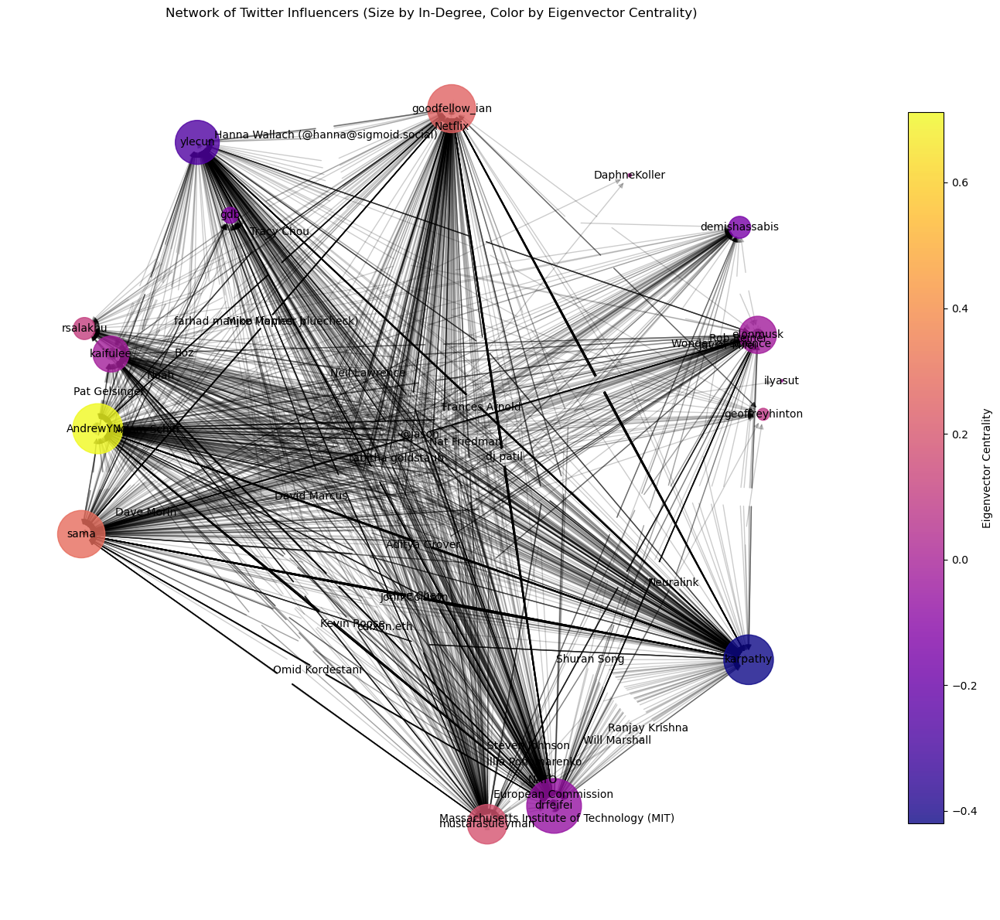

In [19]:
# Set up the graph visualization
fig, ax = plt.subplots(figsize=(14, 12))
pos = nx.spring_layout(G1, seed=42)  # positions for all nodes

# Nodes
node_sizes = [in_degree_centrality[n] * 7000 for n in G1]  # Scale in-degree centrality for visibility
node_colors = [eigenvector_centrality[n] for n in G1]  # Color by eigenvector centrality

# Draw the nodes
nodes = nx.draw_networkx_nodes(G1, pos, node_size=node_sizes, node_color=node_colors, 
                               cmap=plt.cm.plasma, alpha=0.8, ax=ax)

# Draw the edges
nx.draw_networkx_edges(G1, pos, alpha=0.2, ax=ax)

# Draw labels for top 20 by in-degree centrality
top_labels = {n: n for n in top50_nodes_by_in_degree.index}
nx.draw_networkx_labels(G1, pos, labels=top_labels, font_size=10, font_color='black', ax=ax)

# Colorbar for eigenvector centrality
plt.colorbar(nodes, label='Eigenvector Centrality', shrink=0.8)

ax.set_title('Network of Twitter Influencers (Size by In-Degree, Color by Eigenvector Centrality)')
plt.axis('off')  # Hide axes
save_fig('influencers_network')
plt.show()

In [20]:
top_labels

{'drfeifei': 'drfeifei',
 'AndrewYNg': 'AndrewYNg',
 'karpathy': 'karpathy',
 'goodfellow_ian': 'goodfellow_ian',
 'sama': 'sama',
 'ylecun': 'ylecun',
 'mustafasuleyman': 'mustafasuleyman',
 'elonmusk': 'elonmusk',
 'kaifulee': 'kaifulee',
 'rsalakhu': 'rsalakhu',
 'demishassabis': 'demishassabis',
 'gdb': 'gdb',
 'geoffreyhinton': 'geoffreyhinton',
 'DaphneKoller': 'DaphneKoller',
 'ilyasut': 'ilyasut',
 'farhad manjoo (former bluecheck)': 'farhad manjoo (former bluecheck)',
 'Pat Gelsinger': 'Pat Gelsinger',
 'Massachusetts Institute of Technology (MIT)': 'Massachusetts Institute of Technology (MIT)',
 'tabitha goldstaub': 'tabitha goldstaub',
 'Boz': 'Boz',
 'John Collison': 'John Collison',
 'Dave Morin': 'Dave Morin',
 'Rob Reiner': 'Rob Reiner',
 'Netflix': 'Netflix',
 'dj patil': 'dj patil',
 'Neuralink': 'Neuralink',
 'Ranjay Krishna': 'Ranjay Krishna',
 'Neil Lawrence': 'Neil Lawrence',
 'Omid Kordestani': 'Omid Kordestani',
 'Frances Arnold': 'Frances Arnold',
 'Clive Chan':

In [21]:
top50_data = data[data['name_fo'].isin(top_labels.keys())][[
    'screenName_fo', 'name_fo', 'location', 'followersCount_fo', 'friendsCount_fo', 'tweetsCount_fo', 'ai_related', 'if personal account',
    'position_categorized', 'highest_level_org'
]].drop_duplicates('name_fo').set_index('screenName_fo')
top50_data

,name_fo,location,followersCount_fo,friendsCount_fo,tweetsCount_fo,ai_related,if personal account,position_categorized,highest_level_org
screenName_fo,,,,,,,,,
wonderofscience,Wonder of Science,üöÄ,2447566.0,42.0,3929.0,N,N,NaN,NaN
MIT,Massachusetts Institute of Technology (MIT),"Cambridge, MA",1335435.0,573.0,23282.0,N,N,NaN,NaN
tabithagold,tabitha goldstaub,"Cambridge, England",16126.0,9647.0,9537.0,Y,Y,Company Members,Innovate Cambridge
lawrennd,Neil Lawrence,Cambridge,36570.0,0.0,7436.0,Y,Y,Researcher & Scientist,University of Cambridge
francesarnold,Frances Arnold,Caltech,65179.0,774.0,3887.0,N,Y,Researcher & Scientist,Caltech
davidmarcus,David Marcus,"California, USA",123332.0,925.0,6595.0,N,Y,Founder & Executive,Lightspark
fmanjoo,farhad manjoo (former bluecheck),"California, USA",186703.0,5501.0,8772.0,N,Y,Founder & Executive,Wikipedia
Jason,@jason,"California, USA",819438.0,2633.0,52171.0,N,Y,Content Creators,Jason
itsclivetime,Clive Chan,"California, USA",5634.0,1892.0,983.0,Y,Y,Company Members,OpenAI


Saving figure position_distribution


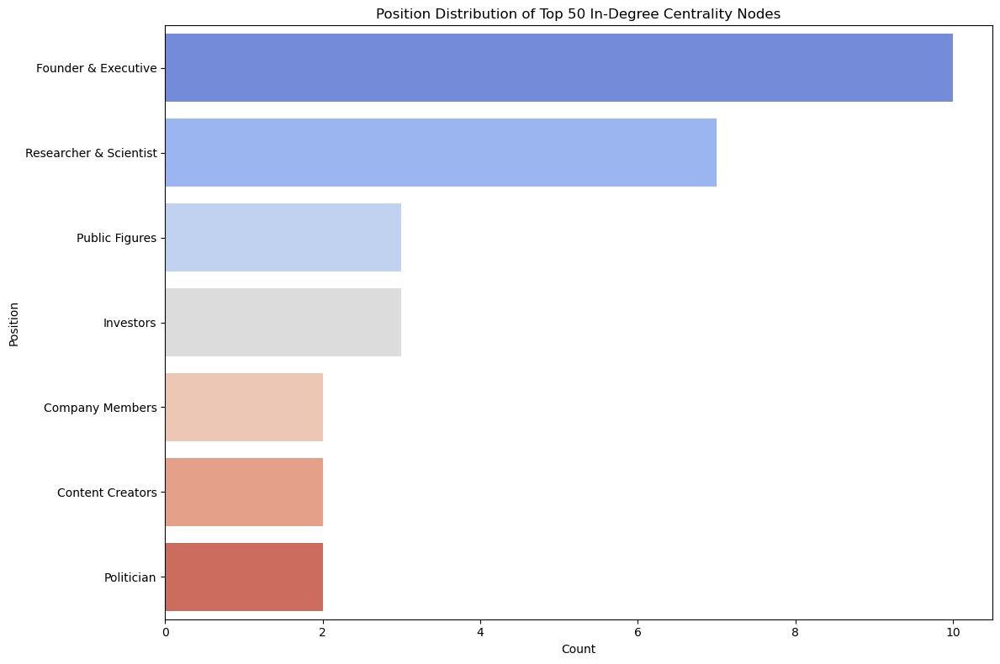

In [22]:
import seaborn as sns

# Analyze the geographical distribution using the 'location_cleansed' column
position_cat = top50_data['position_categorized'].value_counts()  # Top 50 positions

# Plotting the geographic distribution
plt.figure(figsize=(12, 8))
sns.barplot(x=position_cat.values, y=position_cat.index, palette='coolwarm')
plt.title('Position Distribution of Top 50 In-Degree Centrality Nodes')
plt.xlabel('Count')
plt.ylabel('Position')
save_fig('position_distribution')
plt.show()

#### influencer point to followings - Random Layout

Saving figure network_graph2


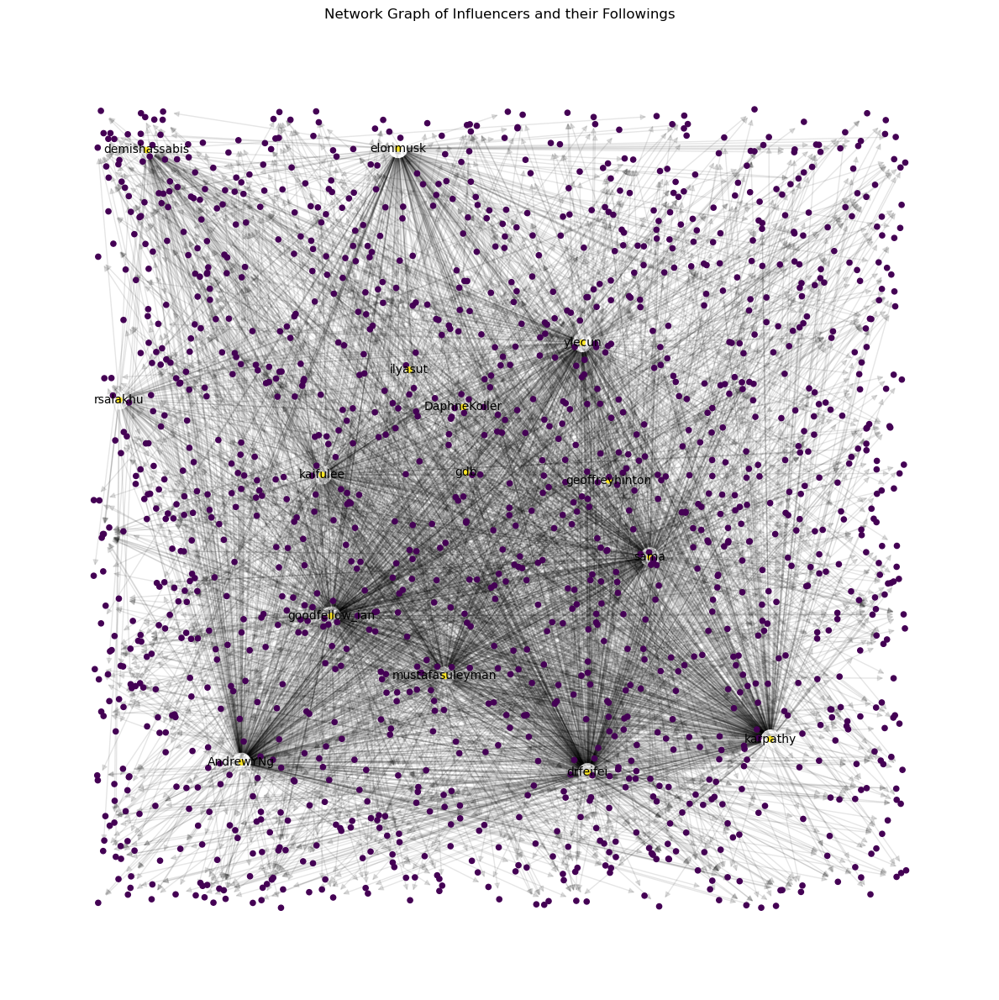

In [23]:
# Create a directed graph
G2 = nx.DiGraph()

# Add edges to the graph
for index, row in reformat_data.iterrows():
    G2.add_node(row['screenName_kol'], type='influencer')
    G2.add_node(row['name_fo'], type='following')
    G2.add_edge(row['screenName_kol'], row['name_fo'], follow_back=row['following_fo'])

# Define edge styles: solid for follow-back, dashed for not
edge_styles = {1: 'solid', 0: 'dashed'}
for u, v, d in G2.edges(data=True):
    G2[u][v]['style'] = edge_styles[d['follow_back']]

# Visualizing the network
plt.figure(figsize=(12, 12))
pos_random = nx.random_layout(G2, seed=42)  # Positions for all nodes

nx.draw_networkx_nodes(G2, pos_random, node_size=20, node_color=[G2.nodes[n]['type'] == 'influencer' for n in G2])
nx.draw_networkx_edges(G2, pos_random, alpha=0.1)
kol_labels = {node: node for node, data in G2.nodes(data=True) if data['type'] == 'influencer'}
nx.draw_networkx_labels(G2, pos_random, labels=kol_labels, font_size=10, font_color='black')

plt.title('Network Graph of Influencers and their Followings')
plt.axis('off')  # Turn off the axis
save_fig('network_graph2')
plt.show()

Nodes are placed randomly in the drawing area. This can be useful for large networks to get a quick sense of the randomness or density.

In [24]:
# The 10 nodes away from central

# Calculate the centroid of the graph
centroid1 = np.mean(list(pos_random.values()), axis=0)

# Calculate the Euclidean distance of each node from the centroid
distances1 = {node: np.linalg.norm(np.array(position) - centroid1) for node, position in pos_random.items()}

# Sort nodes by distance from centroid in descending order
sorted_nodes1 = sorted(distances1, key=distances1.get, reverse=True)

# Select top 10 furthest nodes
furthest_nodes1 = sorted_nodes1[:10]

print("The 10 nodes furthest from the central cluster are:", furthest_nodes1)

The 10 nodes furthest from the central cluster are: ['Antoine Bosselut', 'Henrique Ponde', 'Jon Favreau', 'qilu', 'Stephen King', 'TensorFlow', 'Scuderia Ferrari', 'The Royal Society', 'Dr. Jill Biden', 'New York Times Books']


In [25]:
top10_furthest1 = data[data['name_fo'].isin(furthest_nodes1)].drop_duplicates('name_fo')
top10_furthest1

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,name_kol,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
580,https://twitter.com/qilu,qilu,1.691788e+07,qilu,https://pbs.twimg.com/profile_images/206145978...,passionate about working on things that enable...,NaN,Seattle,Seattle,Thu Oct 23 02:15:04 +0000 2008,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
1483,https://twitter.com/nytimesbooks,nytimesbooks,1.434251e+06,New York Times Books,https://pbs.twimg.com/profile_images/976855357...,This account is no longer active. Follow @nyti...,nytimes.com/books,"New York, NY",New York,Sun Mar 18 19:14:57 +0000 2007,...,Fei-Fei Li,https://pbs.twimg.com/profile_images/841385099...,"Prof (CS @Stanford), Co-Director @StanfordHAI,...",svl.stanford.edu,"Stanford, CA, U.S.A.",Thu Apr 08 05:16:30 +0000 2010,454418.0,1071.0,2548.0,1.0
1701,https://twitter.com/TensorFlow,TensorFlow,2.541070e+08,TensorFlow,https://pbs.twimg.com/profile_images/110333957...,"TensorFlow is a fast, flexible, and scalable o...",tensorflow.org,"Mountain View, CA",Mountain View,Fri Feb 18 16:21:31 +0000 2011,...,Ian Goodfellow,https://pbs.twimg.com/profile_images/111292171...,Research Scientist at DeepMind. Opinions my ow...,iangoodfellow.com,"San Francisco, CA",Mon Sep 12 21:40:46 +0000 2016,296647.0,1104.0,2740.0,1.0
1816,https://twitter.com/ScuderiaFerrari,ScuderiaFerrari,1.082477e+08,Scuderia Ferrari,https://pbs.twimg.com/profile_images/947659786...,The official home of the Tifosi. 16x Constru...,ferrarif1.com,Maranello - Italy,Maranello - Italy,Mon Jan 25 09:43:14 +0000 2010,...,Elon Musk,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0
1858,https://twitter.com/jonfavs,jonfavs,1.304960e+08,Jon Favreau,https://pbs.twimg.com/profile_images/168026926...,"The other one. @PodSaveAmerica, @CrookedMedia,...",offlinewithjon.com,"Los Angeles, CA",Los Angeles,Wed Apr 07 13:10:43 +0000 2010,...,Mustafa Suleyman,https://pbs.twimg.com/profile_images/165354289...,"CEO, Microsoft AI | Author: The Coming Wave | ...",the-coming-wave.com,"Palo Alto, CA",Mon Jan 27 22:49:49 +0000 2014,127186.0,537.0,1934.0,1.0
1908,https://twitter.com/royalsociety,royalsociety,2.856781e+07,The Royal Society,https://pbs.twimg.com/profile_images/114778841...,The Royal Society is a Fellowship of the world...,royalsociety.org/whats-new/,"London, UK",London,Fri Apr 03 14:00:38 +0000 2009,...,Elon Musk,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0
2764,https://twitter.com/ABosselut,ABosselut,1.249433e+09,Antoine Bosselut,https://pbs.twimg.com/profile_images/146351746...,Helping machines make sense of the world. Asst...,atcbosselut.github.io,NaN,NaN,Thu Mar 07 16:03:18 +0000 2013,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
2906,https://twitter.com/HenriquePonde,HenriquePonde,4.274780e+08,Henrique Ponde,https://pbs.twimg.com/profile_images/235877364...,@OpenAI engineer/researcher,NaN,NaN,NaN,Sat Dec 03 15:40:51 +0000 2011,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
3294,https://twitter.com/DrBiden,DrBiden,8.217845e+17,Dr. Jill Biden,https://pbs.twimg.com/profile_images/133414685...,Lifelong educator. Military mother. Grandmothe...,joebiden.com,NaN,NaN,Wed Jan 18 18:21:02 +0000 2017,...,Ian Goodfellow,https://pbs.twimg.com/profile_images/111292171...,Research Scientist at DeepMind. Opinions my ow...,iangoodfellow.com,"San Francisco, CA",M

In [26]:
top10_furthest1.describe()

,userId_fo,followersCount_fo,friendsCount_fo,tweetsCount_fo,certified_fo,following_fo,followedBy_fo,row_id,Frequency,userId_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
count,1.000000e+01,1.000000e+01,10.00000,10.00000,10.000000,0.0,0.0,10.000000,10.000000,1.000000e+01,1.000000e+01,10.000000,10.000000,10.0
mean,8.217845e+16,2.345850e+06,456.90000,21640.20000,0.600000,NaN,NaN,2404.000000,1.700000,1.550898e+17,5.482961e+07,803.700000,16715.600000,1.0
std,2.598711e+17,2.728696e+06,541.51997,28974.65818,0.516398,NaN,NaN,2825.029518,0.674949,3.269580e+17,8.655755e+07,236.971658,18057.322991,0.0
min,1.434251e+06,1.359000e+03,26.00000,38.00000,0.000000,NaN,NaN,231.000000,1.000000,1.605000e+03,1.271860e+05,537.000000,1934.000000,1.0
25%,4.848777e+07,9.192575e+04,113.25000,968.75000,0.000000,NaN,NaN,304.000000,1.000000,4.419640e+07,3.360898e+05,574.000000,2740.000000,1.0
50%,1.923015e+08,8.869100e+05,161.50000,5686.50000,1.000000,NaN,NaN,1062.500000,2.000000,4.610267e+07,1.764333e+06,803.000000,6336.000000,1.0
75%,1.043945e+09,4.674300e+06,615.50000,40012.00000,1.000000,NaN,NaN,4892.250000,2.000000,1.768519e+09,1.358981e+08,1026.500000,36130.500000,1.0
max,8.217845e+17,7.114843e+06,1712.00000,73886.00000,1.000000,NaN,NaN,6957.000000,3.000000,7.754491e+17,1.802553e+08,1104.000000,41915.000000,1.0


In [27]:
top10_furthest1[['name_fo', 'location', 'followersCount_fo', 'friendsCount_fo', 'tweetsCount_fo', 'bio_fo', 'ai_related', 'if personal account', 'position_categorized', 'highest_level_org']]

,name_fo,location,followersCount_fo,friendsCount_fo,tweetsCount_fo,bio_fo,ai_related,if personal account,position_categorized,highest_level_org
580,qilu,Seattle,4581.0,620.0,38.0,passionate about working on things that enable...,N,Y,Researcher & Scientist,Microsoft
1483,New York Times Books,"New York, NY",5544924.0,162.0,64286.0,This account is no longer active. Follow @nyti...,N,N,NaN,NaN
1701,TensorFlow,"Mountain View, CA",376837.0,117.0,2697.0,"TensorFlow is a fast, flexible, and scalable o...",Y,N,NaN,NaN
1816,Scuderia Ferrari,Maranello - Italy,5017759.0,75.0,73886.0,The official home of the Tifosi. 16x Constru...,N,N,NaN,NaN
1858,Jon Favreau,"Los Angeles, CA",1396983.0,1712.0,16894.0,"The other one. @PodSaveAmerica, @CrookedMedia,...",N,Y,Public Figures,Crooked Media
1908,The Royal Society,"London, UK",353960.0,982.0,47718.0,The Royal Society is a Fellowship of the world...,N,N,NaN,NaN
2764,Antoine Bosselut,NaN,3331.0,602.0,986.0,Helping machines make sense of the world. Asst...,Y,Y,Researcher & Scientist,ICepfl
2906,Henrique Ponde,NaN,1359.0,112.0,258.0,@OpenAI engineer/researcher,Y,Y,Researcher & Scientist,OpenAI
3294,Dr. Jill Biden,NaN,3643925.0,26.0,963.0,Lifelong educator. Military mother. Grandmothe...,N,Y,Public Figures,NaN
3367,Stephen King,NaN,7114843.0,161.0,8676.0,Author,N,Y,Public Figures,NaN


Top 10 furthest in random layout: 10 non-KOLs, 3 AI-related, 4 organization account, 3 positions related to Tech, the other position is public figures. 

#### influencer point to followings - Spectral Layout

Saving figure network_graph3


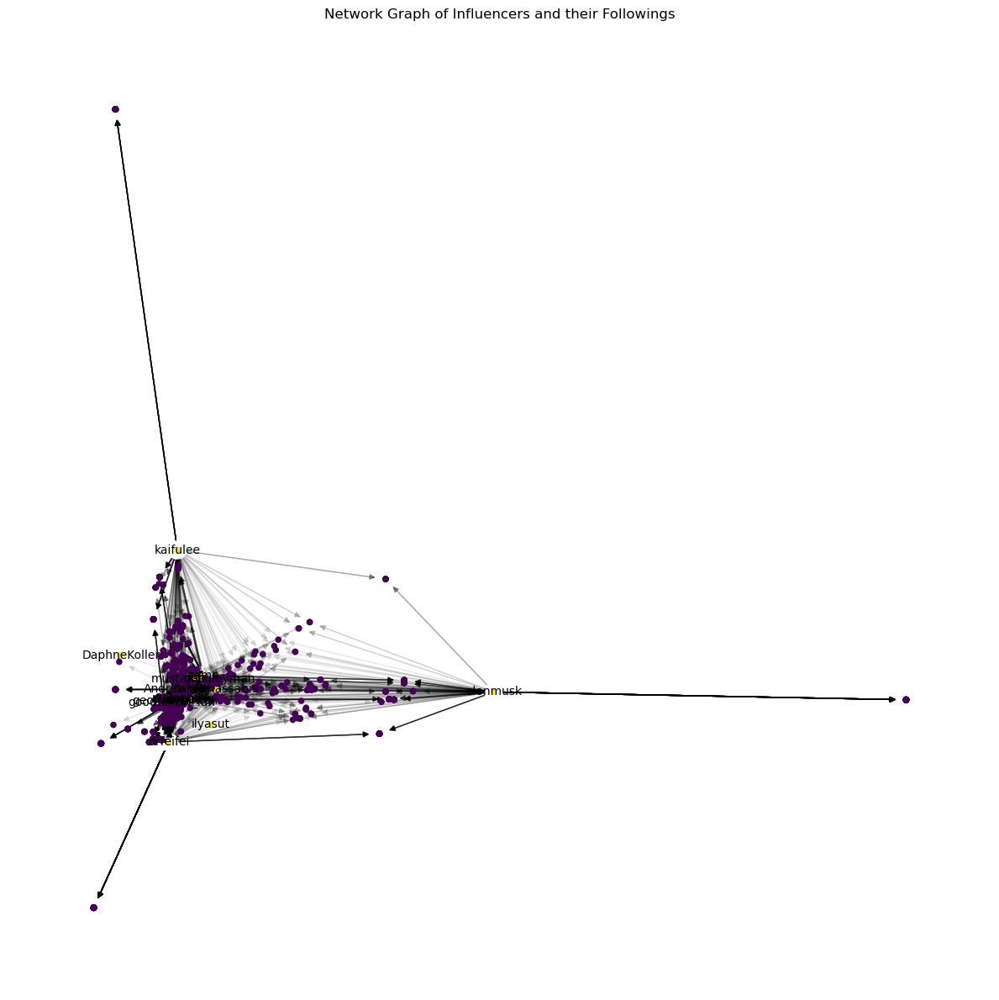

In [28]:
# Create a directed graph
G2_2 = nx.DiGraph()

# Add edges to the graph
for index, row in reformat_data.iterrows():
    G2_2.add_node(row['screenName_kol'], type='influencer')
    G2_2.add_node(row['name_fo'], type='following')
    G2_2.add_edge(row['screenName_kol'], row['name_fo'], follow_back=row['following_fo'])

# Define edge styles: solid for follow-back, dashed for not
edge_styles = {1: 'solid', 0: 'dashed'}
for u, v, d in G2_2.edges(data=True):
    G2_2[u][v]['style'] = edge_styles[d['follow_back']]

# Visualizing the network
plt.figure(figsize=(12, 12))
pos_spectral = nx.spectral_layout(G2_2)  # Positions for all nodes

nx.draw_networkx_nodes(G2_2, pos_spectral, node_size=20, node_color=[G2_2.nodes[n]['type'] == 'influencer' for n in G2_2])
nx.draw_networkx_edges(G2_2, pos_spectral, alpha=0.1)
kol_labels = {node: node for node, data in G2_2.nodes(data=True) if data['type'] == 'influencer'}
nx.draw_networkx_labels(G2_2, pos_spectral, labels=kol_labels, font_size=10, font_color='black')

plt.title('Network Graph of Influencers and their Followings')
plt.axis('off')  # Turn off the axis
save_fig('network_graph3')
plt.show()



Uses the eigenvalues and eigenvectors of the graph Laplacian. The spectral layout is particularly good at illustrating clusters or communities within networks.

In [29]:
# The 10 nodes away from central

# Calculate the centroid of the graph
centroid2 = np.mean(list(pos_spectral.values()), axis=0)

# Calculate the Euclidean distance of each node from the centroid
distances2 = {node: np.linalg.norm(np.array(position) - centroid2) for node, position in pos_spectral.items()}

# Sort nodes by distance from centroid in descending order
sorted_nodes2 = sorted(distances2, key=distances2.get, reverse=True)

# Select top 10 furthest nodes
furthest_nodes2 = sorted_nodes2[:10]

print("The 10 nodes furthest from the central cluster are:", furthest_nodes2)

The 10 nodes furthest from the central cluster are: ['CGTN', 'Idea Bulb Ventures', 'Ellen DeGeneres', 'John Navarre', 'Mayor of London', 'Michelle Malkin', 'Spinoff Room | Viral News, Facts & Trending Topics', 'Businessweek', "Soledad O'Brien", 'Nelly Furtado']


In [30]:
top10_furthest2 = data[data['name_fo'].isin(furthest_nodes2)].drop_duplicates('name_fo')
top10_furthest2

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,name_kol,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
123,https://twitter.com/michellemalkin,michellemalkin,1.597670e+07,Michelle Malkin,https://pbs.twimg.com/profile_images/134863635...,Nothing beside remains.,NaN,USA,USA,Mon Aug 25 02:52:07 +0000 2008,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
809,https://twitter.com/IdeaBulbVC,IdeaBulbVC,3.164844e+09,Idea Bulb Ventures,https://pbs.twimg.com/profile_images/775200748...,Idea Bulb Ventures is the U.S. based investmen...,ideabulb.vc,"San Francisco, CA",San Francisco,Mon Apr 20 04:44:19 +0000 2015,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
1862,https://twitter.com/spinoffroom,spinoffroom,3.392344e+07,"Spinoff Room | Viral News, Facts & Trending To...",https://pbs.twimg.com/profile_images/172778949...,Spinoff Room is your X source for the latest c...,spinoffroom.com,"Los Angeles, CA",Los Angeles,Tue Apr 21 14:43:32 +0000 2009,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
2029,https://twitter.com/MayorofLondon,MayorofLondon,1.470012e+07,Mayor of London,https://pbs.twimg.com/profile_images/176977668...,Tweets before 9 May 2016 are from the previous...,instagram.com/mayorofldn,London,London,Thu May 08 13:23:35 +0000 2008,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
2156,https://twitter.com/BW,BW,6.735878e+07,Businessweek,https://pbs.twimg.com/profile_images/163172400...,Covering the business world like no one else.\...,businessweek.com,"Homes, screens, and stores",Homes,Thu Aug 20 16:50:58 +0000 2009,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
2449,https://twitter.com/EllenDeGeneres,EllenDeGeneres,1.584641e+07,Ellen DeGeneres,https://pbs.twimg.com/profile_images/147812077...,"Comedian, talk show host and ice road trucker....",ellen.tv/m/linkinbio,California,California,Thu Aug 14 03:50:42 +0000 2008,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
2464,https://twitter.com/JohndeNavarra,JohndeNavarra,2.542267e+08,John Navarre,https://pbs.twimg.com/profile_images/167220859...,Adventurer | Advocate | Entrepreneur | Crea...,ReturnTheStone.org,"Cairo, Egypt",Cairo,Fri Feb 18 21:43:41 +0000 2011,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
2611,https://twitter.com/CGTNOfficial,CGTNOfficial,1.115875e+09,CGTN,https://pbs.twimg.com/profile_images/124646774...,CGTN is an international media organization. I...,CGTN.com,"Beijing, China",Beijing,Thu Jan 24 03:18:59 +0000 2013,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
2727,https://twitter.com/soledadobrien,soledadobrien,2.654832e+07,Soledad O'Brien,https://pbs.twimg.com/profile_images/150358487...,working mom,instagram.com/soledadobrien,New York,New Yor

In [31]:
top10_furthest2.describe()

,userId_fo,followersCount_fo,friendsCount_fo,tweetsCount_fo,certified_fo,following_fo,followedBy_fo,row_id,Frequency,userId_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
count,1.000000e+01,1.000000e+01,1.000000e+01,10.000000,10.000000,0.0,0.0,10.000000,10.0,10.0,10.0,10.0,10.0,10.0
mean,4.760050e+08,1.011016e+07,4.385821e+05,82756.000000,0.800000,NaN,NaN,1455.400000,1.0,50940456.0,1469626.0,658.0,3743.0,1.0
std,1.003877e+09,2.290938e+07,1.230502e+06,98958.026879,0.421637,NaN,NaN,2363.812467,0.0,0.0,0.0,0.0,0.0,0.0
min,1.470012e+07,3.080000e+02,7.700000e+01,92.000000,0.000000,NaN,NaN,33.000000,1.0,50940456.0,1469626.0,658.0,3743.0,1.0
25%,1.861960e+07,1.455914e+06,8.475000e+02,6277.000000,1.000000,NaN,NaN,404.500000,1.0,50940456.0,1469626.0,658.0,3743.0,1.0
50%,4.233750e+07,2.137199e+06,2.758500e+03,51622.500000,1.000000,NaN,NaN,535.500000,1.0,50940456.0,1469626.0,658.0,3743.0,1.0
75%,2.075097e+08,3.117762e+06,2.305950e+04,115043.000000,1.000000,NaN,NaN,701.500000,1.0,50940456.0,1469626.0,658.0,3743.0,1.0
max,3.164844e+09,7.446237e+07,3.921496e+06,300629.000000,1.000000,NaN,NaN,7497.000000,1.0,50940456.0,1469626.0,658.0,3743.0,1.0


In [32]:
top10_furthest2[['name_fo', 'location', 'followersCount_fo', 'friendsCount_fo', 'tweetsCount_fo', 'bio_fo', 'ai_related', 'if personal account', 'position_categorized', 'highest_level_org']]

,name_fo,location,followersCount_fo,friendsCount_fo,tweetsCount_fo,bio_fo,ai_related,if personal account,position_categorized,highest_level_org
123,Michelle Malkin,USA,2001880.0,17001.0,79079.0,Nothing beside remains.,N,Y,Public Figures,Conservatives
809,Idea Bulb Ventures,"San Francisco, CA",308.0,105.0,155.0,Idea Bulb Ventures is the U.S. based investmen...,N,Y,Investors,NaN
1862,"Spinoff Room | Viral News, Facts & Trending To...","Los Angeles, CA",1989400.0,3921496.0,72048.0,Spinoff Room is your X source for the latest c...,N,N,NaN,NaN
2029,Mayor of London,London,3176800.0,1607.0,31197.0,Tweets before 9 May 2016 are from the previous...,N,N,NaN,NaN
2156,Businessweek,"Homes, screens, and stores",2272518.0,597.0,192562.0,Covering the business world like no one else.\...,N,N,NaN,NaN
2449,Ellen DeGeneres,California,74462366.0,25079.0,24643.0,"Comedian, talk show host and ice road trucker....",N,Y,Public Figures,NaN
2464,John Navarre,"Cairo, Egypt",34980.0,1599.0,92.0,Adventurer | Advocate | Entrepreneur | Crea...,N,Y,Investors,NaN
2611,CGTN,"Beijing, China",12944649.0,77.0,300629.0,CGTN is an international media organization. I...,N,N,NaN,NaN
2727,Soledad O'Brien,New York,1278086.0,414350.0,127031.0,working mom,N,Y,Public Figures,CNN
3158,Nelly Furtado,NaN,2940649.0,3910.0,124.0,I'm like a bird,N,Y,Company Members,Twitter


Top 10 furthest in spectral layout: 10 non-KOLs, None AI related, 4 corporate accounts, positions includes investors, public figures and company members, not related to tech.

### Centrality Metrics

Saving figure network_graph2


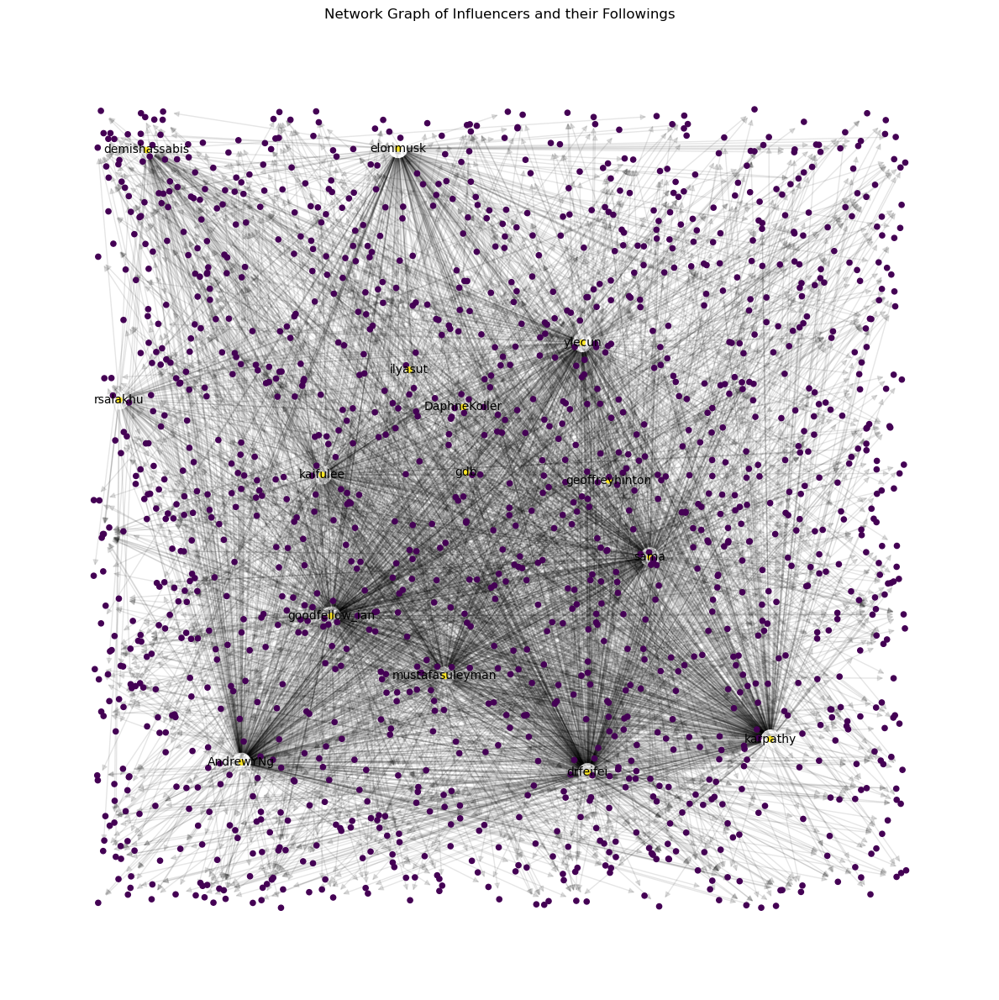

In [33]:
# Create a directed graph
G2 = nx.DiGraph()

# Add edges to the graph
for index, row in reformat_data.iterrows():
    G2.add_node(row['screenName_kol'], type='influencer')
    G2.add_node(row['name_fo'], type='following')
    G2.add_edge(row['screenName_kol'], row['name_fo'], follow_back=row['following_fo'])

# Define edge styles: solid for follow-back, dashed for not
edge_styles = {1: 'solid', 0: 'dashed'}
for u, v, d in G2.edges(data=True):
    G2[u][v]['style'] = edge_styles[d['follow_back']]

# Visualizing the network
plt.figure(figsize=(12, 12))
pos_random = nx.random_layout(G2, seed=42)  # Positions for all nodes

nx.draw_networkx_nodes(G2, pos_random, node_size=20, node_color=[G2.nodes[n]['type'] == 'influencer' for n in G2])
nx.draw_networkx_edges(G2, pos_random, alpha=0.1)
kol_labels = {node: node for node, data in G2.nodes(data=True) if data['type'] == 'influencer'}
nx.draw_networkx_labels(G2, pos_random, labels=kol_labels, font_size=10, font_color='black')

plt.title('Network Graph of Influencers and their Followings')
plt.axis('off')  # Turn off the axis
save_fig('network_graph2')
plt.show()

In [34]:
# Calculate network metrics
degree_centrality = nx.degree_centrality(G2)
in_degree_centrality = nx.in_degree_centrality(G2)
out_degree_centrality = nx.out_degree_centrality(G2)
betweenness_centrality = nx.betweenness_centrality(G2)
eigenvector_centrality = nx.eigenvector_centrality(G2)
clossness_centrality = nx.closeness_centrality(G2)

# Prepare the data for display
centrality_measures = pd.DataFrame({
    'Degree Centrality': degree_centrality,
    'In-Degree Centrality': in_degree_centrality,
    'Out-Degree Centrality': out_degree_centrality,
    'Betweenness Centrality': betweenness_centrality,
    'Eigenvector Centrality': eigenvector_centrality,
    'Closeness Centrality': clossness_centrality
})


In [35]:
# Display the top 50 nodes by in-degree centrality
top50_nodes_by_in_degree = centrality_measures.sort_values(by='In-Degree Centrality', ascending=False).head(50)
top50_nodes_by_in_degree

,Degree Centrality,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Eigenvector Centrality,Closeness Centrality
Ilya Sutskever,0.008910,0.008910,0.0,0.0,0.113603,0.008910
OpenAI,0.008225,0.008225,0.0,0.0,0.104874,0.008225
Jeff Dean (@),0.008225,0.008225,0.0,0.0,0.104874,0.008225
Paul Graham,0.007539,0.007539,0.0,0.0,0.096146,0.007539
Oriol Vinyals,0.006854,0.006854,0.0,0.0,0.087418,0.006854
Andrej Karpathy,0.006854,0.006854,0.0,0.0,0.087418,0.006854
Yann LeCun,0.006854,0.006854,0.0,0.0,0.087418,0.006854
Geoffrey Hinton,0.006854,0.006854,0.0,0.0,0.087418,0.006854
Bill Gates,0.006854,0.006854,0.0,0.0,0.087418,0.006854
Demis Hassabis,0.006854,0.006854,0.0,0.0,0.087418,0.006854


Saving figure influencers_network


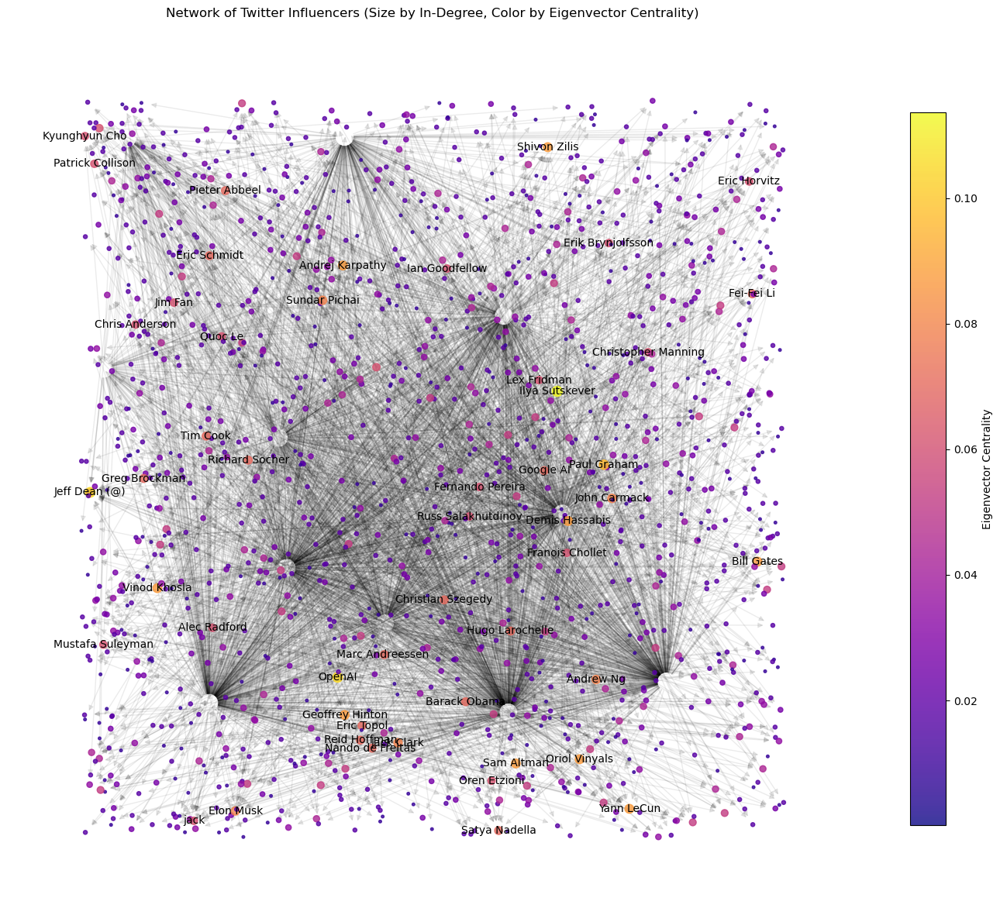

In [36]:
# Set up the graph visualization
fig, ax = plt.subplots(figsize=(14, 12))
pos = nx.random_layout(G2, seed=42)  # positions for all nodes

# Nodes
node_sizes = [in_degree_centrality[n] * 10000 for n in G2]  # Scale in-degree centrality for visibility
node_colors = [eigenvector_centrality[n] for n in G2]  # Color by eigenvector centrality

# Draw the nodes
nodes = nx.draw_networkx_nodes(G2, pos, node_size=node_sizes, node_color=node_colors, 
                               cmap=plt.cm.plasma, alpha=0.8, ax=ax)

# Draw the edges
nx.draw_networkx_edges(G2, pos, alpha=0.08, ax=ax)

# Draw labels for top 50 by in-degree centrality
top_labels = {n: n for n in top50_nodes_by_in_degree.index}
nx.draw_networkx_labels(G2, pos, labels=top_labels, font_size=10, font_color='black', ax=ax)

# Colorbar for eigenvector centrality
plt.colorbar(nodes, label='Eigenvector Centrality', shrink=0.8)

ax.set_title('Network of Twitter Influencers (Size by In-Degree, Color by Eigenvector Centrality)')
plt.axis('off')  # Hide axes
save_fig('influencers_network')
plt.show()


10/15 influencer in top 50.

Eigenvector centrality is a measure of the influence of a node within a network. It assigns relative scores to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes. 

Influential Connections: The node is likely connected to other nodes that are themselves influential or have high eigenvector centralities. In simpler terms, this node is followed by KOLs who are also followed by many other KOLs.
Indirect Influence: Even if the node doesn't have a very high degree centrality (i.e., it's not followed by a large number of KOLs), its high eigenvector centrality suggests that its followers are significant influencers within the network. This can mean that the node has indirect influence through its powerful connections.

Potential for Information Spread: A node with high eigenvector centrality is well-positioned to spread information effectively through the network, as its tweets or messages are likely to be seen and shared by other influential users.

Strategic Importance: From a marketing or information campaign perspective, such a node might be very valuable despite not being a KOL itself. Engaging with this user could lead to higher visibility among KOLs and their followings due to the user's influential network position.

Community Hub: The node might serve as a hub within a community of KOLs. This could indicate that the user is a thought leader in a niche area or subject that is of particular interest to KOLs.

In summary, a high eigenvector centrality in this dataset would indicate that the node is not just popular in terms of the number of KOLs following it, but also in terms of the quality of those connections in the network. Such nodes might be central in the flow of information and could have a substantial impact on the network despite possibly not being KOLs themselves.

In [37]:
top_labels

{'Ilya Sutskever': 'Ilya Sutskever',
 'OpenAI': 'OpenAI',
 'Jeff Dean (@)': 'Jeff Dean (@)',
 'Paul Graham': 'Paul Graham',
 'Oriol Vinyals': 'Oriol Vinyals',
 'Andrej Karpathy': 'Andrej Karpathy',
 'Yann LeCun': 'Yann LeCun',
 'Geoffrey Hinton': 'Geoffrey Hinton',
 'Bill Gates': 'Bill Gates',
 'Demis Hassabis': 'Demis Hassabis',
 'Sam Altman': 'Sam Altman',
 'Vinod Khosla': 'Vinod Khosla',
 'Shivon Zilis': 'Shivon Zilis',
 'Jack Clark': 'Jack Clark',
 'John Carmack': 'John Carmack',
 'Andrew Ng': 'Andrew Ng',
 'Elon Musk': 'Elon Musk',
 'Sundar Pichai': 'Sundar Pichai',
 'Reid Hoffman': 'Reid Hoffman',
 'Richard Socher': 'Richard Socher',
 'Fei-Fei Li': 'Fei-Fei Li',
 'Nando de Freitas ': 'Nando de Freitas ',
 'Eric Topol': 'Eric Topol',
 'Christian Szegedy': 'Christian Szegedy',
 'Hugo Larochelle': 'Hugo Larochelle',
 'Satya Nadella': 'Satya Nadella',
 'Eric Schmidt': 'Eric Schmidt',
 'Marc Andreessen ': 'Marc Andreessen ',
 'Google AI': 'Google AI',
 'Barack Obama': 'Barack Obama',


In [38]:
top_labels_nonKOL = {name: value for name, value in top_labels.items() if name not in KOL_list}

In [39]:
top_labels_nonKOL
# count = 37

{'OpenAI': 'OpenAI',
 'Jeff Dean (@)': 'Jeff Dean (@)',
 'Paul Graham': 'Paul Graham',
 'Oriol Vinyals': 'Oriol Vinyals',
 'Bill Gates': 'Bill Gates',
 'Vinod Khosla': 'Vinod Khosla',
 'Shivon Zilis': 'Shivon Zilis',
 'Jack Clark': 'Jack Clark',
 'John Carmack': 'John Carmack',
 'Sundar Pichai': 'Sundar Pichai',
 'Reid Hoffman': 'Reid Hoffman',
 'Richard Socher': 'Richard Socher',
 'Nando de Freitas ': 'Nando de Freitas ',
 'Eric Topol': 'Eric Topol',
 'Christian Szegedy': 'Christian Szegedy',
 'Hugo Larochelle': 'Hugo Larochelle',
 'Satya Nadella': 'Satya Nadella',
 'Eric Schmidt': 'Eric Schmidt',
 'Marc Andreessen ': 'Marc Andreessen ',
 'Google AI': 'Google AI',
 'Barack Obama': 'Barack Obama',
 'Pieter Abbeel': 'Pieter Abbeel',
 'Tim Cook': 'Tim Cook',
 'Patrick Collison': 'Patrick Collison',
 'Quoc Le': 'Quoc Le',
 'jack': 'jack',
 'Fernando Pereira': 'Fernando Pereira',
 'Eric Horvitz': 'Eric Horvitz',
 'Erik Brynjolfsson': 'Erik Brynjolfsson',
 'Kyunghyun Cho': 'Kyunghyun Cho',


In [40]:
top_data_nonKOL = data_cleaned[data_cleaned['name_fo'].isin(top_labels_nonKOL.keys())][[
    'screenName_fo', 'name_fo', 'location', 'location_cleansed', 'followersCount_fo', 'friendsCount_fo', 'tweetsCount_fo', 'ai_related', 'if personal account',
    'position_categorized', 'highest_level_org',
]].drop_duplicates('name_fo').set_index('screenName_fo')
top_data_nonKOL = top_data_nonKOL[top_data_nonKOL['if personal account'] == 'Y']
top_data_nonKOL # count = 35

,name_fo,location,location_cleansed,followersCount_fo,friendsCount_fo,tweetsCount_fo,ai_related,if personal account,position_categorized,highest_level_org
screenName_fo,,,,,,,,,,
BarackObama,Barack Obama,"Washington, DC",Washington,131913049.0,543248.0,17013.0,N,Y,Politician,Government
fchollet,Franois Chollet,United States,USA,466714.0,766.0,22368.0,Y,Y,Company Members,Google
ChrSzegedy,Christian Szegedy,"Sunnyvale, CA",Sunnyvale,31878.0,2109.0,6985.0,Y,Y,Researcher & Scientist,NaN
erikbryn,Erik Brynjolfsson,Stanford,Stanford,208650.0,4408.0,26608.0,Y,Y,Researcher & Scientist,Stanford University
BillGates,Bill Gates,"Seattle, WA",Seattle,64520390.0,586.0,4458.0,Y,Y,Founder & Executive,Microsoft
erichorvitz,Eric Horvitz,Seattle WA USA,Seattle,28496.0,1585.0,2520.0,Y,Y,Founder & Executive,Microsoft
etzioni,Oren Etzioni,Seattle,Seattle,27543.0,1636.0,8150.0,Y,Y,Investors,AI2 Incubator
jackclarkSF,Jack Clark,"San Francisco, CA",San Francisco,67173.0,4674.0,31551.0,Y,Y,Founder & Executive,AnthropicAI
AlecRad,Alec Radford,"San Francisco, CA",San Francisco,42713.0,317.0,560.0,Y,Y,Researcher & Scientist,OpenAI


Saving figure position_distribution


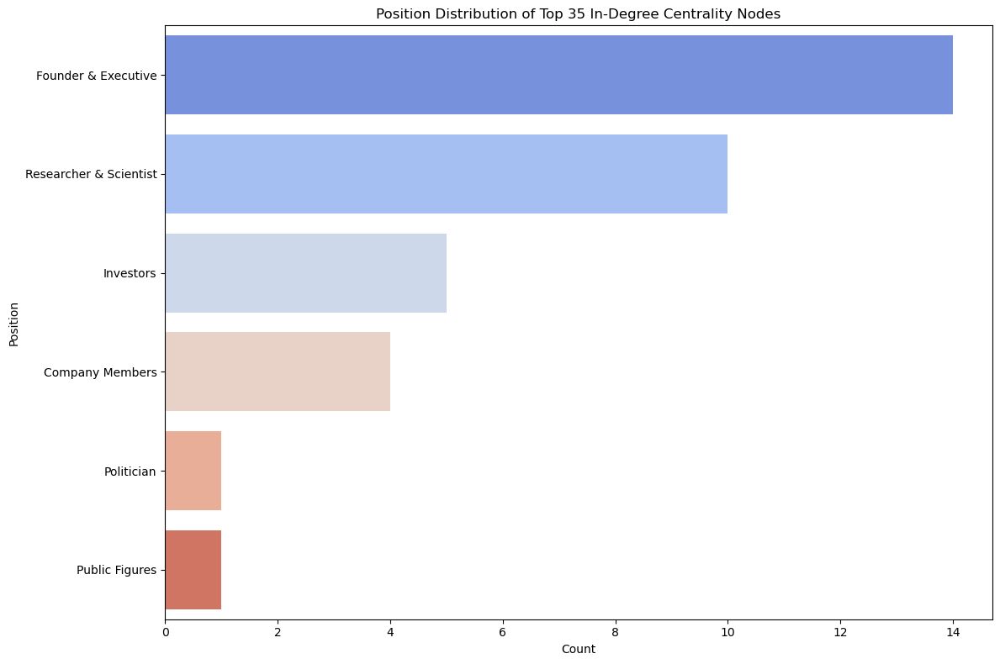

In [41]:
position_cat = top_data_nonKOL['position_categorized'].value_counts()  

plt.figure(figsize=(12, 8))
sns.barplot(x=position_cat.values, y=position_cat.index, palette='coolwarm')
plt.title('Position Distribution of Top 35 In-Degree Centrality Nodes')
plt.xlabel('Count')
plt.ylabel('Position')
save_fig('position_distribution')
plt.show()

Saving figure location_distribution


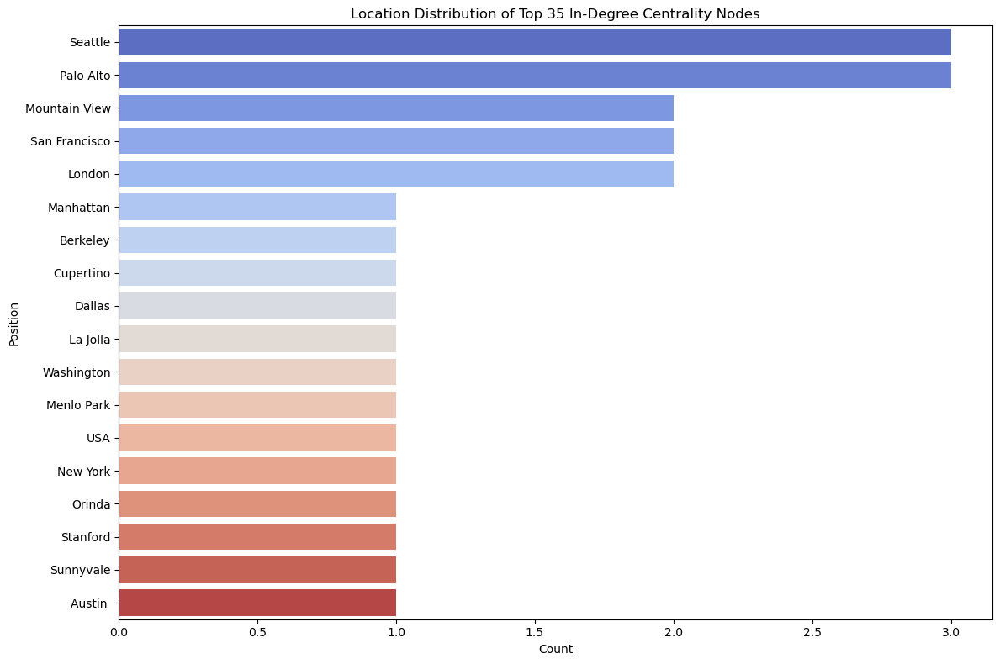

In [42]:
location_cat = top_data_nonKOL['location_cleansed'].value_counts()  

plt.figure(figsize=(12, 8))
sns.barplot(x=location_cat.values, y=location_cat.index, palette='coolwarm')
plt.title('Location Distribution of Top 35 In-Degree Centrality Nodes')
plt.xlabel('Count')
plt.ylabel('Position')
save_fig('location_distribution')
plt.show()

### Social Influence - overall

In [43]:
G5 = nx.DiGraph()

for _, row in data_cleaned.iterrows():
    # G5.add_node(row['screenName_kol'], type='influencer')
    G5.add_node(row['name_fo'], type='following')
    G5.add_edge(row['name_kol'], row['name_fo'])
    
    G5.nodes[row['name_fo']]['followersCount'] = row['followersCount_fo']
    G5.nodes[row['name_fo']]['tweetsCount'] = row['tweetsCount_fo']
    G5.nodes[row['name_fo']]['friendsCount'] = row['friendsCount_fo']
    # G5.nodes[row['name_fo']]['certified'] = row['certified_kol']  # Verification status could also indicate influence

In [44]:
# Normalize metrics
max_followers = max(nx.get_node_attributes(G5, 'followersCount').values(), default=0)  # Adding default to handle empty cases
max_degree = max(nx.degree_centrality(G5).values(), default=0)  # Adding default to handle empty cases

for node in G5.nodes():
    followers_count = G5.nodes[node].get('followersCount', 0)  # Provide a default if missing
    followers_norm = followers_count / max_followers if max_followers > 0 else 0
    degree_norm = nx.degree_centrality(G5).get(node, 0) / max_degree if max_degree > 0 else 0
    G5.nodes[node]['influence_score'] = 0.5 * followers_norm + 0.5 * degree_norm

/Users/yanhuanhuang/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


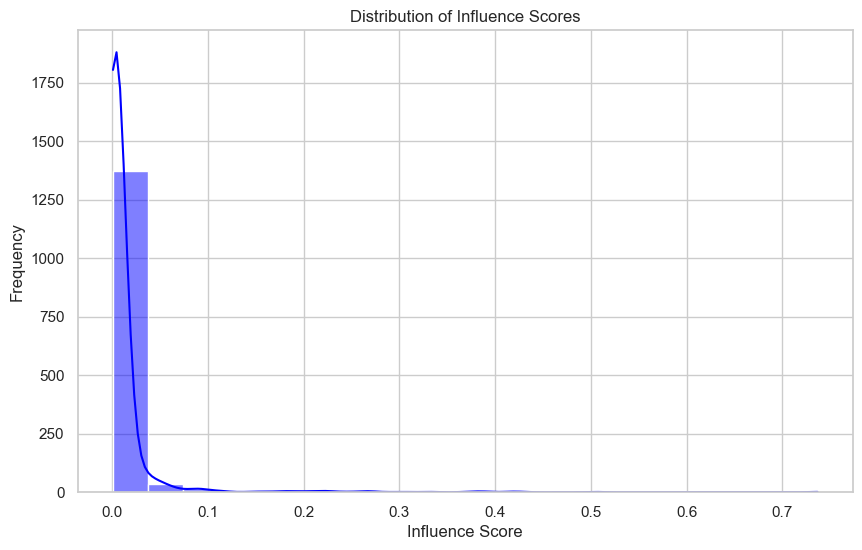

In [45]:
influence_scores = [G5.nodes[node]['influence_score'] for node in G5.nodes()]

sns.set(style="whitegrid")

# Plotting the distribution of influence scores with seaborn
plt.figure(figsize=(10, 6))  # Setting the figure size
sns.histplot(influence_scores, bins=20, kde=True, color='blue')  # KDE adds a density curve
plt.title('Distribution of Influence Scores')
plt.xlabel('Influence Score')
plt.ylabel('Frequency')
plt.show()


In [46]:
# Finding top influencers within KOL's followings
top_influencers = sorted(G5.nodes(data=True), key=lambda x: x[1].get('influence_score', 0), reverse=True)[:200]

top_influencers_in_followings = pd.DataFrame({
    'Node': [node for node, data in top_influencers],
    'Influence Score': [data['influence_score'] for node, data in top_influencers],
    'Followers Count': [data.get('followersCount', 'N/A') for node, data in top_influencers]
})

# Exclude KOL
top_influencers_in_followings = top_influencers_in_followings[~top_influencers_in_followings['Node'].isin(KOL_list)].reset_index(drop = True)
top_influencers_in_followings

,Node,Influence Score,Followers Count
0,Barack Obama,0.373198,131913149.0
1,Rihanna,0.300350,107949316.0
2,Narendra Modi,0.270136,97057010.0
3,Taylor Swift,0.267075,95296828.0
4,Donald J. Trump,0.245971,87360322.0
...,...,...,...
180,Richard Dawkins,0.011093,3013917.0
181,The Babylon Bee,0.011002,3637781.0
182,John Kerry,0.010943,3288199.0
183,The Independent,0.010909,3604478.0


In [47]:
top_influencers_full = data_cleaned[data_cleaned['name_fo'].isin(top_influencers_in_followings['Node'])].drop_duplicates('name_fo').reset_index(drop = True)
top_influencers_full

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,name_kol,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
0,https://twitter.com/redbullracing,redbullracing,2.260878e+08,Oracle Red Bull Racing,https://pbs.twimg.com/profile_images/177574120...,Currently in Japan #GivesYouWings,onein.bio/redbullracing,Worldwide,NaN,Mon Dec 13 08:12:04 +0000 2010,...,Elon Musk,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0
1,https://twitter.com/newscientist,newscientist,1.965883e+07,New Scientist,https://pbs.twimg.com/profile_images/960860144...,The best place to find out whats new in scienc...,newscientist.com,Worldwide,NaN,Wed Jan 28 16:05:49 +0000 2009,...,Elon Musk,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0
2,https://twitter.com/JohnCena,JohnCena,1.416646e+08,John Cena,https://pbs.twimg.com/profile_images/158973093...,A forum of thoughts and perspectives designed ...,makeawish.org/donate,"West Newbury, MA",West Newbury,Sat May 08 17:43:50 +0000 2010,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
3,https://twitter.com/ScienceMagazine,ScienceMagazine,3.237283e+07,Science Magazine,https://pbs.twimg.com/profile_images/100191823...,The world's leading outlet for cutting-edge re...,science.org,"Washington, DC & Cambridge, UK",Washington,Fri Apr 17 11:37:12 +0000 2009,...,Ian Goodfellow,https://pbs.twimg.com/profile_images/111292171...,Research Scientist at DeepMind. Opinions my ow...,iangoodfellow.com,"San Francisco, CA",Mon Sep 12 21:40:46 +0000 2016,296647.0,1104.0,2740.0,1.0
4,https://twitter.com/BarackObama,BarackObama,8.132860e+05,Barack Obama,https://pbs.twimg.com/profile_images/132964752...,"Dad, husband, President, citizen.",barackobamabooks.com,"Washington, DC",Washington,Mon Mar 05 22:08:25 +0000 2007,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180,https://twitter.com/HarvardBiz,HarvardBiz,1.480027e+07,Harvard Business Review,https://pbs.twimg.com/profile_images/124977896...,The best ideas in business and management to h...,hbr.org,NaN,NaN,Fri May 16 15:50:47 +0000 2008,...,Fei-Fei Li,https://pbs.twimg.com/profile_images/841385099...,"Prof (CS @Stanford), Co-Director @StanfordHAI,...",svl.stanford.edu,"Stanford, CA, U.S.A.",Thu Apr 08 05:16:30 +0000 2010,454418.0,1071.0,2548.0,1.0
181,https://twitter.com/FLOTUS,FLOTUS,1.349155e+18,Jill Biden,https://pbs.twimg.com/profile_images/134986869...,First Lady of the United States Jill Biden. Co...,whitehouse.gov/cancermoonshot,NaN,NaN,Wed Jan 13 00:57:47 +0000 2021,...,Fei-Fei Li,https://pbs.twimg.com/profile_images/841385099...,"Prof (CS @Stanford), Co-Director @StanfordHAI,...",svl.stanford.edu,"Stanford, CA, U.S.A.",Thu Apr 08 05:16:30 +0000 2010,454418.0,1071.0,2548.0,1.0
182,https://twitter.com/ZelenskyyUa,ZelenskyyUa,1.120634e+18,Volodymyr Zelenskyy /,https://pbs.twimg.com/profile_images/158555004...,President of Ukraine /,president.gov.ua,NaN,NaN,Tue Apr 23 10:21:15 +0000 2019,...,Fei-Fei Li,https://pbs.twimg.com/profile_images/841385099...,"Prof (CS @Stanford), Co-Director @StanfordHAI,...",svl.stanford.edu,"Stanford, CA, U.S.A.",Thu Apr 08 05:16:30 +0000 2010,454418.0,1071.0,2548.0,1.0
183,https://twitter.com/AnnaKendrick47,AnnaKendrick47,5.994940e+07,Anna Kendrick,https://pbs.twimg.com/profile_images/481264998...,kind of a lot,NaN,NaN,NaN,Sat Jul 25 01:57:57 +0000 2009,...,Andrew Ng,https://pbs.twimg.com/profile_images/733174243...,Co-Founder 

In [48]:
top_influencers_person = top_influencers_full[top_influencers_full['if personal account'] == 'Y']
top_influencers_person

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,name_kol,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
2,https://twitter.com/JohnCena,JohnCena,1.416646e+08,John Cena,https://pbs.twimg.com/profile_images/158973093...,A forum of thoughts and perspectives designed ...,makeawish.org/donate,"West Newbury, MA",West Newbury,Sat May 08 17:43:50 +0000 2010,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
4,https://twitter.com/BarackObama,BarackObama,8.132860e+05,Barack Obama,https://pbs.twimg.com/profile_images/132964752...,"Dad, husband, President, citizen.",barackobamabooks.com,"Washington, DC",Washington,Mon Mar 05 22:08:25 +0000 2007,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
5,https://twitter.com/KamalaHarris,KamalaHarris,3.035499e+07,Kamala Harris,https://pbs.twimg.com/profile_images/159224131...,"Fighting for the people. Wife, Momala, Auntie....",joebiden.com,"Washington, DC",Washington,Sat Apr 11 00:42:07 +0000 2009,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
6,https://twitter.com/JoeBiden,JoeBiden,9.390910e+05,Joe Biden,https://pbs.twimg.com/profile_images/130876966...,"Husband to @DrBiden, proud father and grandfat...",joebiden.com,"Washington, DC",Washington,Sun Mar 11 17:51:24 +0000 2007,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
12,https://twitter.com/MichelleObama,MichelleObama,4.094866e+08,Michelle Obama,https://pbs.twimg.com/profile_images/176283627...,Girl from the South Side and former First Lady...,michelleobamabooks.com,"Washington, DC",Washington,Thu Nov 10 20:13:01 +0000 2011,...,Andrew Ng,https://pbs.twimg.com/profile_images/733174243...,Co-Founder of Coursera; Stanford CS adjunct fa...,andrewng.org,"Palo Alto, CA",Thu Nov 18 03:39:11 +0000 2010,1003468.0,902.0,1666.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,https://twitter.com/StephenKing,StephenKing,2.233154e+09,Stephen King,https://pbs.twimg.com/profile_images/378800000...,Author,stephenking.com,NaN,NaN,Fri Dec 06 15:26:35 +0000 2013,...,Elon Musk,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0
181,https://twitter.com/FLOTUS,FLOTUS,1.349155e+18,Jill Biden,https://pbs.twimg.com/profile_images/134986869...,First Lady of the United States Jill Biden. Co...,whitehouse.gov/cancermoonshot,NaN,NaN,Wed Jan 13 00:57:47 +0000 2021,...,Fei-Fei Li,https://pbs.twimg.com/profile_images/841385099...,"Prof (CS @Stanford), Co-Director @StanfordHAI,...",svl.stanford.edu,"Stanford, CA, U.S.A.",Thu Apr 08 05:16:30 +0000 2010,454418.0,1071.0,2548.0,1.0
182,https://twitter.com/ZelenskyyUa,ZelenskyyUa,1.120634e+18,Volodymyr Zelenskyy /,https://pbs.twimg.com/profile_images/158555004...,President of Ukraine /,president.gov.ua,NaN,NaN,Tue Apr 23 10:21:15 +0000 2019,...,Fei-Fei Li,https://pbs.twimg.com/profile_images/841385099...,"Prof (CS @Stanford), Co-Director @StanfordHAI,...",svl.stanford.edu,"Stanford, CA, U.S.A.",Thu Apr 08 05:16:30 +0000 2010,454418.0,1071.0,2548.0,1.0
183,https://twitter.com/AnnaKendrick47,AnnaKendrick47,5.994940e+07,Anna Kendrick,https://pbs.twimg.com/profile_images/481264998...,kind of a lot,NaN,NaN,NaN,Sat Jul 25 01:57:57 +0000 2009,...,Andrew Ng,https://pbs.twimg.com/profile_images/733174243...,Co-Founder of Coursera; S

Saving figure position_distribution2


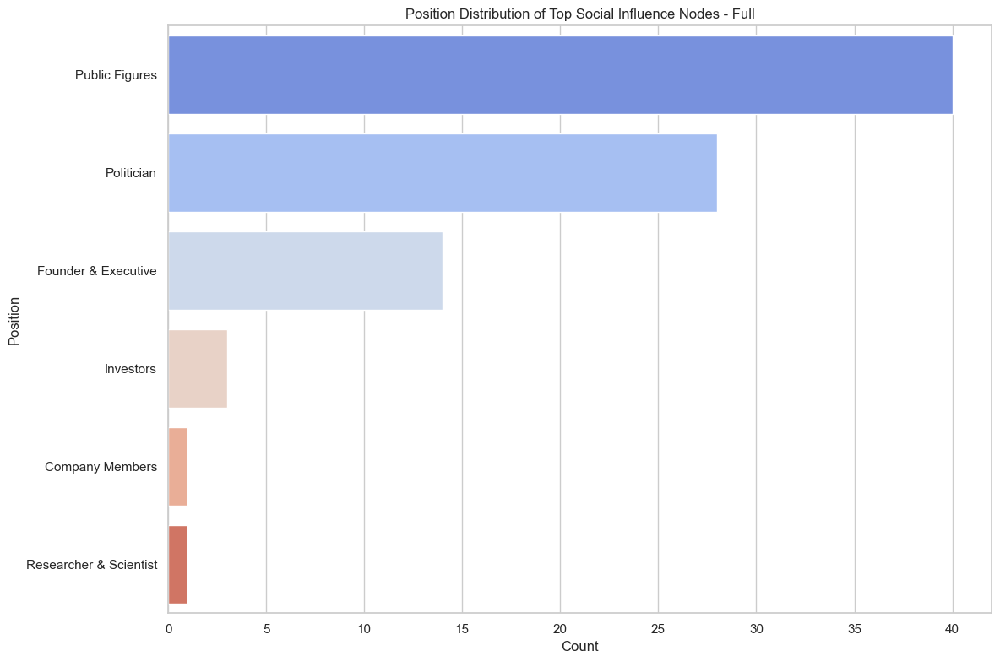

In [49]:
position_cat2 = top_influencers_person['position_categorized'].value_counts()  

plt.figure(figsize=(12, 8))
sns.barplot(x=position_cat2.values, y=position_cat2.index, palette='coolwarm')
plt.title('Position Distribution of Top Social Influence Nodes - Full')
plt.xlabel('Count')
plt.ylabel('Position')
save_fig('position_distribution2')
plt.show()

Saving figure location_distribution2


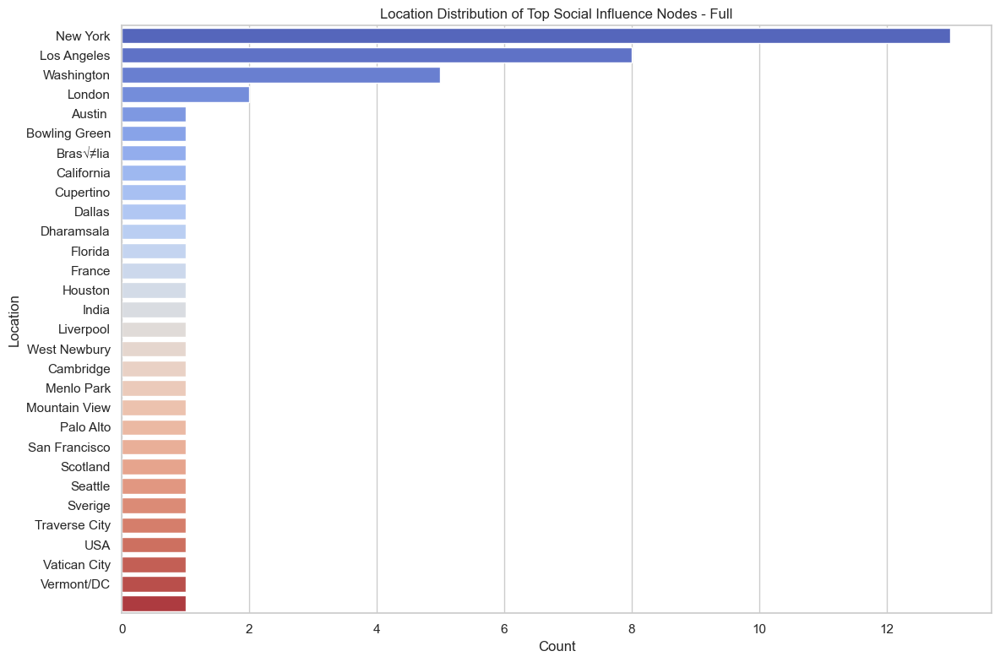

In [50]:
location_cat2 = top_influencers_person['location_cleansed'].value_counts()  

plt.figure(figsize=(12, 8))
sns.barplot(x=location_cat2.values, y=location_cat2.index, palette='coolwarm')
plt.title('Location Distribution of Top Social Influence Nodes - Full')
plt.xlabel('Count')
plt.ylabel('Location')
save_fig('location_distribution2')
plt.show()

### Social Influence - ai_related

In [51]:
G6 = nx.DiGraph()

for _, row in data_cleaned.iterrows():
    if row['ai_related'] == 'Y':
        # G6.add_node(row['screenName_kol'], type='influencer')
        G6.add_node(row['name_fo'], type='following')
        G6.add_edge(row['name_kol'], row['name_fo'])
    
        G6.nodes[row['name_fo']]['followersCount'] = row['followersCount_fo']
        G6.nodes[row['name_fo']]['tweetsCount'] = row['tweetsCount_fo']
        G6.nodes[row['name_fo']]['friendsCount'] = row['friendsCount_fo']
        # G6.nodes[row['name_fo']]['certified'] = row['certified_kol']  # Verification status could also indicate influence


In [52]:
# Normalize metrics
max_followers = max(nx.get_node_attributes(G6, 'followersCount').values(), default=0)  # Adding default to handle empty cases
max_degree = max(nx.degree_centrality(G6).values(), default=0)  # Adding default to handle empty cases

for node in G6.nodes():
    followers_count = G6.nodes[node].get('followersCount', 0)  # Provide a default if missing
    followers_norm = followers_count / max_followers if max_followers > 0 else 0
    degree_norm = nx.degree_centrality(G6).get(node, 0) / max_degree if max_degree > 0 else 0
    G6.nodes[node]['influence_score'] = 0.5 * followers_norm + 0.5 * degree_norm

In [53]:
# Finding top influencers within KOL's followings
top_influencers2 = sorted(G6.nodes(data=True), key=lambda x: x[1].get('influence_score', 0), reverse=True)[:200]

top_influencers_in_followings2 = pd.DataFrame({
    'Node': [node for node, data in top_influencers2],
    'Influence Score': [data['influence_score'] for node, data in top_influencers2],
    'Followers Count': [data.get('followersCount', 'N/A') for node, data in top_influencers2]
})

# Exclude KOL
top_influencers_in_followings2 = top_influencers_in_followings2[~top_influencers_in_followings2['Node'].isin(KOL_list)].reset_index(drop = True)
# top_influencers_in_followings2

In [54]:
top_influencers_full2 = data_cleaned[data_cleaned['name_fo'].isin(top_influencers_in_followings2['Node'])].drop_duplicates('name_fo').reset_index(drop = True)
# top_influencers_full2

In [55]:
top_influencers_person2 = top_influencers_full2[top_influencers_full2['if personal account'] == 'Y']
top_influencers_person2

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,name_kol,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
0,https://twitter.com/haldaume3,haldaume3,1.581065e+08,Hal Daum III,https://pbs.twimg.com/profile_images/127373598...,"Human-centered AI #HCAI, NLP & ML. Director @t...",NaN,"Washington, D.C., USA",Washington,Mon Jun 21 20:09:58 +0000 2010,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
1,https://twitter.com/GaryMarcus,GaryMarcus,2.322943e+08,Gary Marcus,https://pbs.twimg.com/profile_images/174904753...,"A leading expert on AI, spoke at US Senate AI ...",garymarcus.com,"Vancouver, BC",Vancouver,Thu Dec 30 19:20:12 +0000 2010,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
2,https://twitter.com/roydanroy,roydanroy,4.407370e+07,Dan Roy,https://pbs.twimg.com/profile_images/647245794...,"Research Director, @VectorInst. Canada CIFAR A...",danroy.org,University of Toronto,Toronto,Tue Jun 02 06:32:26 +0000 2009,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
3,https://twitter.com/rasbt,rasbt,8.656224e+08,Sebastian Raschka,https://pbs.twimg.com/profile_images/166118744...,Machine learning & AI researcher writing at ht...,sebastianraschka.com/books/,United States,USA,Sun Oct 07 02:06:16 +0000 2012,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
4,https://twitter.com/fchollet,fchollet,6.874672e+07,Franois Chollet,https://pbs.twimg.com/profile_images/161100936...,Deep learning @google. Creator of Keras. Autho...,fchollet.com,United States,USA,Tue Aug 25 17:09:25 +0000 2009,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178,https://twitter.com/danielgross,danielgross,3.819058e+07,Daniel Gross,https://pbs.twimg.com/profile_images/144286218...,https://t.co/NZsHpnOzcn,NaN,NaN,NaN,Wed May 06 14:39:30 +0000 2009,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
179,https://twitter.com/rbhar90,rbhar90,3.242991e+09,Bharath Ramsundar,https://pbs.twimg.com/profile_images/609229213...,Founder and CEO @deepforestsci. Creator of @de...,rbharath.github.io,NaN,NaN,Fri Jun 12 05:21:44 +0000 2015,...,Andrej Karpathy,https://pbs.twimg.com/profile_images/129666729...,"🧑‍🍳. Previously Director of AI @ Tesla, foundi...",karpathy.ai,Stanford,Tue Apr 21 06:49:15 +0000 2009,962447.0,898.0,8617.0,1.0
180,https://twitter.com/ericjang11,ericjang11,2.309106e+09,Eric Jang,https://pbs.twimg.com/profile_images/149431592...,"physical AGI at 1X. Author of ""AI is Good for ...",evjang.com,NaN,NaN,Fri Jan 24 23:27:11 +0000 2014,...,Andrej Karpathy,https://pbs.twimg.com/profile_images/129666729...,"🧑‍🍳. Previously Director of AI @ Tesla, foundi...",karpathy.ai,Stanford,Tue Apr 21 06:49:15 +0000 2009,962447.0,898.0,8617.0,1.0
183,https://twitter.com/mer__edith,mer__edith,2.492917e+09,Meredith Whittaker,https://pbs.twimg.com/profile_images/156647060...,"President of @signalapp, Chief Advisor to @ain...",signal.org,NaN,NaN,Tue May 13 12:39:44 +0000 2014,...,Kai-Fu Lee,https://pbs.twimg.com/profile_ima

Saving figure position_distribution3


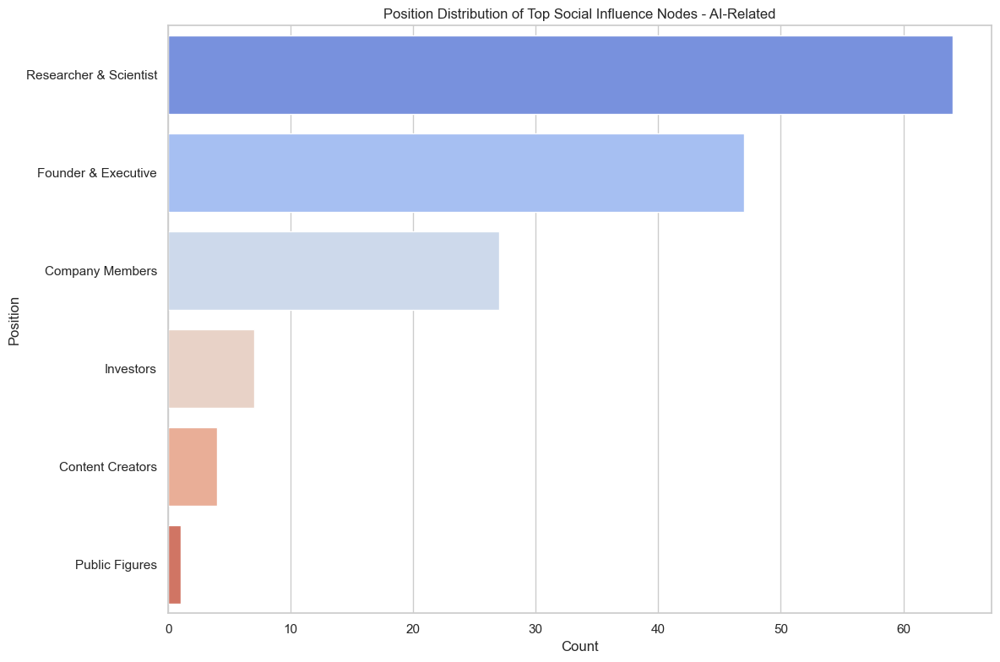

In [56]:
position_cat3 = top_influencers_person2['position_categorized'].value_counts()  

plt.figure(figsize=(12, 8))
sns.barplot(x=position_cat3.values, y=position_cat3.index, palette='coolwarm')
plt.title('Position Distribution of Top Social Influence Nodes - AI-Related')
plt.xlabel('Count')
plt.ylabel('Position')
save_fig('position_distribution3')
plt.show()

Saving figure location_distribution3


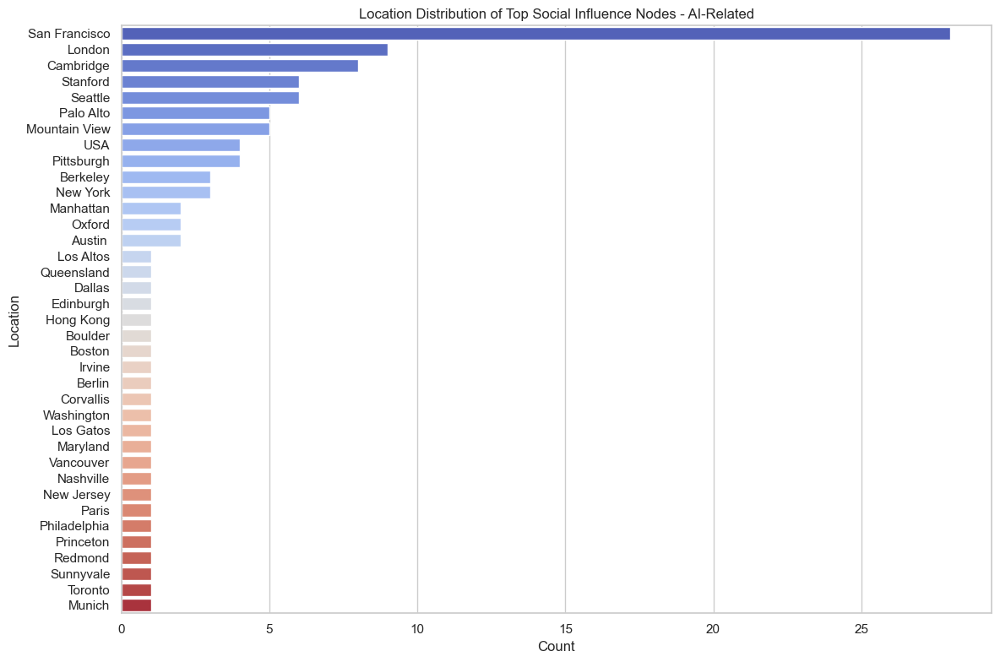

In [57]:
location_cat3 = top_influencers_person2['location_cleansed'].value_counts()  

plt.figure(figsize=(12, 8))
sns.barplot(x=location_cat3.values, y=location_cat3.index, palette='coolwarm')
plt.title('Location Distribution of Top Social Influence Nodes - AI-Related')
plt.xlabel('Count')
plt.ylabel('Location')
save_fig('location_distribution3')
plt.show()

### Social influence - scientist/research

In [58]:
G7 = nx.DiGraph()

for _, row in data_cleaned2.iterrows():
    if row['position_categorized'] == 'Researcher & Scientist':
        # G7.add_node(row['screenName_kol'], type='influencer')
        G7.add_node(row['name_fo'], type='following')
        G7.add_edge(row['name_kol'], row['name_fo'])
    
        G7.nodes[row['name_fo']]['followersCount'] = row['followersCount_fo']
        G7.nodes[row['name_fo']]['tweetsCount'] = row['tweetsCount_fo']
        G7.nodes[row['name_fo']]['friendsCount'] = row['friendsCount_fo']
        # G7.nodes[row['name_fo']]['certified'] = row['certified_kol']  # Verification status could also indicate influence


In [59]:
# Normalize metrics
max_followers = max(nx.get_node_attributes(G7, 'followersCount').values(), default=0)  # Adding default to handle empty cases
max_degree = max(nx.degree_centrality(G7).values(), default=0)  # Adding default to handle empty cases

for node in G7.nodes():
    followers_count = G7.nodes[node].get('followersCount', 0)  # Provide a default if missing
    followers_norm = followers_count / max_followers if max_followers > 0 else 0
    degree_norm = nx.degree_centrality(G7).get(node, 0) / max_degree if max_degree > 0 else 0
    G7.nodes[node]['influence_score'] = 0.5 * followers_norm + 0.5 * degree_norm

In [60]:
# Finding top influencers within KOL's followings
top_influencers3 = sorted(G7.nodes(data=True), key=lambda x: x[1].get('influence_score', 0), reverse=True)[:200]

top_influencers_in_followings3 = pd.DataFrame({
    'Node': [node for node, data in top_influencers3],
    'Influence Score': [data['influence_score'] for node, data in top_influencers3],
    'Followers Count': [data.get('followersCount', 'N/A') for node, data in top_influencers3]
})

# Exclude KOL
top_influencers_in_followings3 = top_influencers_in_followings3[~top_influencers_in_followings3['Node'].isin(KOL_list)].reset_index(drop = True)
# top_influencers_in_followings3

In [61]:
top_influencers_full3 = data_cleaned[data_cleaned['name_fo'].isin(top_influencers_in_followings3['Node'])].drop_duplicates('name_fo').reset_index(drop = True)
# top_influencers_full3

In [62]:
top_influencers_person3 = top_influencers_full3[top_influencers_full3['if personal account'] == 'Y']
top_influencers_person3

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,name_kol,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
0,https://twitter.com/giffmana,giffmana,2.236048e+09,Lucas Beyer (bl16),https://pbs.twimg.com/profile_images/378800000...,"Researcher (Google DeepMind/Brain in Zrich, ex...",lucasb.eyer.be,"Z√ºrich, Suisse",Suisse,Sun Dec 08 13:31:09 +0000 2013,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
1,https://twitter.com/EricLander46,EricLander46,1.386753e+18,Eric Lander,https://pbs.twimg.com/profile_images/139543125...,Science Advisor to the President and Director ...,whitehouse.gov,"Washington, DC",Washington,Mon Apr 26 18:42:49 +0000 2021,...,Fei-Fei Li,https://pbs.twimg.com/profile_images/841385099...,"Prof (CS @Stanford), Co-Director @StanfordHAI,...",svl.stanford.edu,"Stanford, CA, U.S.A.",Thu Apr 08 05:16:30 +0000 2010,454418.0,1071.0,2548.0,1.0
2,https://twitter.com/haldaume3,haldaume3,1.581065e+08,Hal Daum III,https://pbs.twimg.com/profile_images/127373598...,"Human-centered AI #HCAI, NLP & ML. Director @t...",NaN,"Washington, D.C., USA",Washington,Mon Jun 21 20:09:58 +0000 2010,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
3,https://twitter.com/KofmanMichael,KofmanMichael,1.262846e+18,Michael Kofman,https://pbs.twimg.com/profile_images/172479009...,"Senior Fellow, Carnegie Endowment. Defense ana...",carnegieendowment.org/experts/2362,"Washington, D.C. area",Washington,Tue May 19 20:40:40 +0000 2020,...,Fei-Fei Li,https://pbs.twimg.com/profile_images/841385099...,"Prof (CS @Stanford), Co-Director @StanfordHAI,...",svl.stanford.edu,"Stanford, CA, U.S.A.",Thu Apr 08 05:16:30 +0000 2010,454418.0,1071.0,2548.0,1.0
4,https://twitter.com/BretWeinstein,BretWeinstein,7.868345e+07,Bret Weinstein,https://pbs.twimg.com/profile_images/171927006...,DarkHorse. Prof in Exile. Trade-Offs. Telomere...,rumble.com/c/darkhorse,"Washington State, USA",Washington,Wed Sep 30 19:10:22 +0000 2009,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,https://twitter.com/arankomatsuzaki,arankomatsuzaki,7.944334e+17,Aran Komatsuzaki,https://pbs.twimg.com/profile_images/156122098...,@TeraflopAI,arankomatsuzaki.wordpress.com/about-me/,NaN,NaN,Fri Nov 04 06:57:37 +0000 2016,...,Andrej Karpathy,https://pbs.twimg.com/profile_images/129666729...,"🧑‍🍳. Previously Director of AI @ Tesla, foundi...",karpathy.ai,Stanford,Tue Apr 21 06:49:15 +0000 2009,962447.0,898.0,8617.0,1.0
183,https://twitter.com/minchoi,minchoi,2.311399e+07,Min Choi,https://pbs.twimg.com/profile_images/163835911...,"AI Educator. about AI, solutions and interest...",NaN,NaN,NaN,Fri Mar 06 20:29:30 +0000 2009,...,Kai-Fu Lee,https://pbs.twimg.com/profile_images/101643813...,"#AI Expert, CEO of @01ai_yi and Chairman of 创新...",01.ai,"Beijing, China",Fri Jun 26 05:45:54 +0000 2009,1469626.0,658.0,3743.0,1.0
184,https://twitter.com/timnitGebru,timnitGebru,3.598312e+08,@timnitGebru@dair-community.social on Mastodon,https://pbs.twimg.com/profile_images/166044380...,she/her\nI am at @timnitGebru@dair-community.s...,dair-institute.org,NaN,NaN,Mon Aug 22 07:22:32 +0000 2011,...,Ian Goodfellow,https://pbs.twimg.com/profile_images/111292171...,Research Scientist at DeepMind. Opinions my ow...,iangoodfellow.com,"San Francisco, CA",Mon Sep 12 21:40:46 +0000 2016,296647.0,1104.0,2740.0,1.0
185,https://twitter.com/mmitchell_ai,mmitchell_ai,7.485286e+17,MMitchell,https://pb

Saving figure org_distribution1


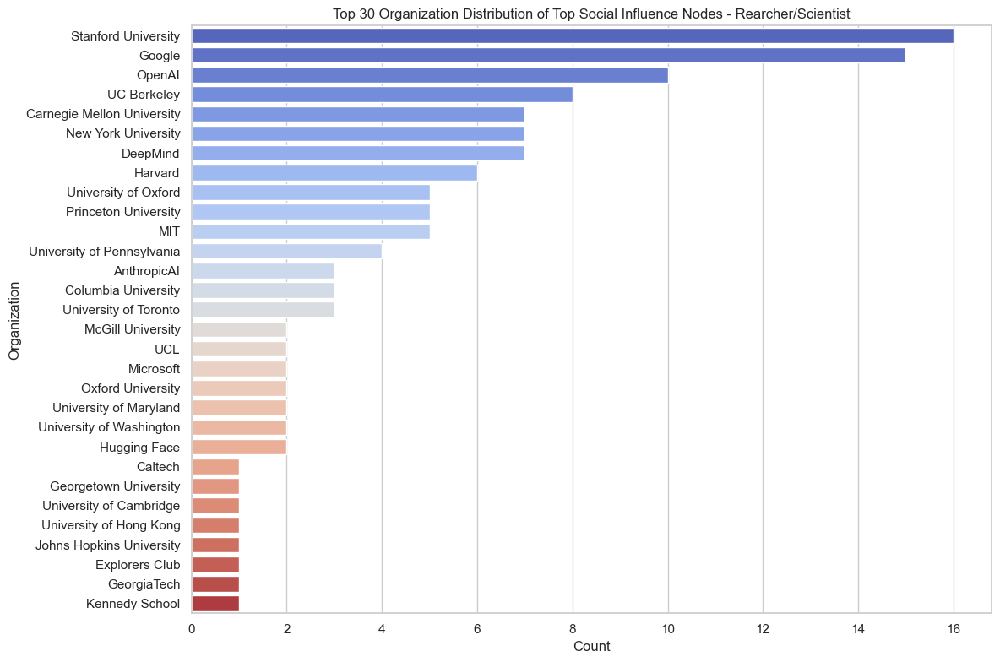

In [63]:
org_cat = top_influencers_person3['highest_level_org'].value_counts().head(30)

plt.figure(figsize=(12, 8))
sns.barplot(x=org_cat.values, y=org_cat.index, palette='coolwarm')
plt.title('Top 30 Organization Distribution of Top Social Influence Nodes - Rearcher/Scientist')
plt.xlabel('Count')
plt.ylabel('Organization')
save_fig('org_distribution1')
plt.show()

Saving figure location_distribution4


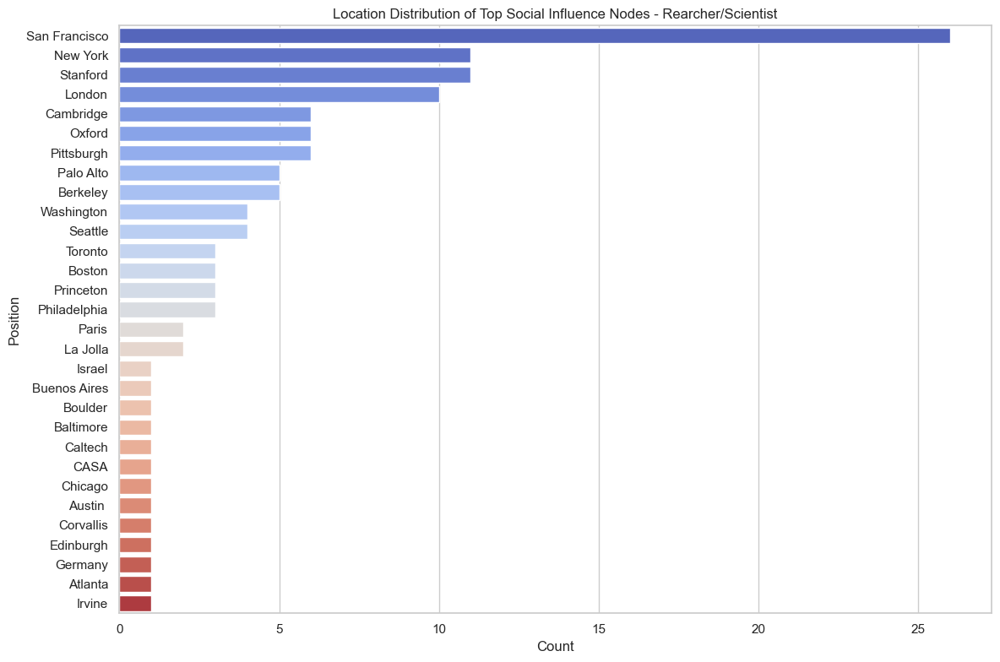

In [64]:
location_cat4 = top_influencers_person3['location_cleansed'].value_counts().head(30)

plt.figure(figsize=(12, 8))
sns.barplot(x=location_cat4.values, y=location_cat4.index, palette='coolwarm')
plt.title('Location Distribution of Top Social Influence Nodes - Rearcher/Scientist')
plt.xlabel('Count')
plt.ylabel('Position')
save_fig('location_distribution4')
plt.show()

### Hidden Gem

In [65]:
data_cleaned['followersCount_fo'].describe()

count    3.641000e+03
mean     2.889949e+06
std      1.372349e+07
min      3.080000e+02
25%      2.072000e+04
50%      9.230600e+04
75%      8.452140e+05
max      1.802535e+08
Name: followersCount_fo, dtype: float64

In [66]:
in_degree_df = pd.DataFrame.from_dict(in_degree_centrality, orient='index', columns=['centrality'])
# in_degree_df
in_degree_merged = pd.merge(data_cleaned, in_degree_df, left_on='name_fo', right_index=True, how='left')
in_degree_merged

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol,centrality
0,https://twitter.com/wonderofscience,wonderofscience,3.101589e+09,Wonder of Science,https://pbs.twimg.com/profile_images/104644161...,"""The most beautiful thing we can experience is...",linktr.ee/wonderofscience,üöÄ,NaN,Sat Mar 21 12:29:37 +0000 2015,...,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0,0.000685
1,https://twitter.com/WallStreetSilv,WallStreetSilv,1.366566e+18,Wall Street Silver,https://pbs.twimg.com/profile_images/148217996...,"Finance, economics, news, memes and silver. Co...",linktr.ee/wssilver,üëâ,NaN,Tue Mar 02 01:47:11 +0000 2021,...,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0,0.000685
2,https://twitter.com/AMAZlNGNATURE,AMAZlNGNATURE,2.828213e+09,Nature is Amazing,https://pbs.twimg.com/profile_images/992795937...,Animals Nature Discovery,NaN,üåç,NaN,Tue Sep 23 15:27:26 +0000 2014,...,https://pbs.twimg.com/profile_images/168332538...,NaN,NaN,NaN,Tue Jun 02 20:12:29 +0000 2009,180255265.0,574.0,41915.0,1.0,0.000685
3,https://twitter.com/giffmana,giffmana,2.236048e+09,Lucas Beyer (bl16),https://pbs.twimg.com/profile_images/378800000...,"Researcher (Google DeepMind/Brain in Zrich, ex...",lucasb.eyer.be,"Z√ºrich, Suisse",Suisse,Sun Dec 08 13:31:09 +0000 2013,...,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0,0.001371
4,https://twitter.com/giffmana,giffmana,2.236048e+09,Lucas Beyer (bl16),https://pbs.twimg.com/profile_images/378800000...,"Researcher (Google DeepMind/Brain in Zrich, ex...",lucasb.eyer.be,"Z√ºrich, Suisse",Suisse,Sun Dec 08 13:31:09 +0000 2013,...,https://pbs.twimg.com/profile_images/129666729...,"🧑‍🍳. Previously Director of AI @ Tesla, foundi...",karpathy.ai,Stanford,Tue Apr 21 06:49:15 +0000 2009,962447.0,898.0,8617.0,1.0,0.001371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3636,https://twitter.com/OpenAI,OpenAI,4.398626e+09,OpenAI,https://pbs.twimg.com/profile_images/163405803...,OpenAIs mission is to ensure that artificial g...,openai.com,NaN,NaN,Sun Dec 06 22:51:08 +0000 2015,...,https://pbs.twimg.com/profile_images/733174243...,Co-Founder of Coursera; Stanford CS adjunct fa...,andrewng.org,"Palo Alto, CA",Thu Nov 18 03:39:11 +0000 2010,1003468.0,902.0,1666.0,1.0,0.008225
3637,https://twitter.com/midjourney,midjourney,1.307056e+18,Midjourney,https://pbs.twimg.com/profile_images/150007894...,New research lab. Exploring new mediums of tho...,midjourney.com,NaN,NaN,Fri Sep 18 20:38:07 +0000 2020,...,https://pbs.twimg.com/profile_images/733174243...,Co-Founder of Coursera; Stanford CS adjunct fa...,andrewng.org,"Palo Alto, CA",Thu Nov 18 03:39:11 +0000 2010,1003468.0,902.0,1666.0,1.0,0.001371
3638,https://twitter.com/OpenAIDevs,OpenAIDevs,1.633875e+18,OpenAI Developers,https://pbs.twimg.com/profile_images/172059874...,Official @OpenAI account for anyone building o...,platform.openai.com,NaN,NaN,Thu Mar 09 16:58:51 +0000 2023,...,https://pbs.twimg.com/profile_images/733174243...,Co-Founder of Coursera; Stanford CS adjunct fa...,andrewng.org,"Palo Alto, CA",Thu Nov 18 03:39:11 +0000 2010,1003468.0,902.0,1666.0,1.0,0.001371
3639,https://twitter.com/hsu_steve,hsu_steve,1.610781e+08,steve hsu,https://pbs.twimg.com/profile_images/237384547...,"physicist, startup founder, blogger, dad",infoproc.blogspot.com,NaN,NaN,Tue Jun 29 23:02:37 +0000 2010,...,https://pbs.twimg.com/profile_images/733174243...,Co-Founder of Coursera; Stanford CS adjunct fa...,andrewng.org,"Palo Alto, CA",Thu Nov 18 03:39:11 +0000 2010,1003468.0,902.0,166

In [67]:
in_degree_merged['centrality'].describe()

count    3641.000000
mean        0.002459
std         0.001603
min         0.000685
25%         0.001371
50%         0.002056
75%         0.003427
max         0.008910
Name: centrality, dtype: float64

In [68]:
# Compute how many KOLs follow each person
followed_by = {fo: len(set(G2.predecessors(fo))) for fo in set(data_cleaned['name_fo'])}

# Merge this data back into the original DataFrame
kol_following_count = in_degree_merged[['name_fo', 'followersCount_fo', 'if personal account', 'ai_related', 'centrality']].drop_duplicates().copy()
kol_following_count['followed_by_kols'] = kol_following_count['name_fo'].map(followed_by)

# Filter to find users followed by many KOLs but with fewer followers and high centrality
threshold_followers = 5000  
threshold_kols = 2        
threshold_in_degree = 0.002

selected_people = kol_following_count[(kol_following_count['followed_by_kols'] >= threshold_kols) &
                        (kol_following_count['followersCount_fo'] < threshold_followers) & 
                        (kol_following_count['centrality'] > threshold_in_degree)]


In [69]:
selected_people

,name_fo,followersCount_fo,if personal account,ai_related,centrality,followed_by_kols
486,Tom Brown,4697.0,Y,Y,0.002056,3
503,Tom Brown,4698.0,Y,Y,0.002056,3
681,Vicki Cheung,3390.0,Y,Y,0.002056,3
723,Nicolas Pinto,2861.0,Y,Y,0.002056,3
985,Jacob Menick,4311.0,Y,Y,0.002056,3
997,Jacob Menick,4313.0,Y,Y,0.002056,3
1432,Chris Baldassano,2685.0,Y,Y,0.002056,3
2260,"Dr S Osindero (soc, sindero)+elsewhere tbd",4228.0,Y,N,0.002056,3
2617,Frank Chen,1573.0,Y,N,0.002056,3
2787,Armand Joulin,4005.0,Y,Y,0.002056,3


In [70]:
selected_people = selected_people[(selected_people['if personal account'] == 'Y') & (selected_people['ai_related'] == 'Y')].drop_duplicates(subset='name_fo')
selected_people

,name_fo,followersCount_fo,if personal account,ai_related,centrality,followed_by_kols
486,Tom Brown,4697.0,Y,Y,0.002056,3
681,Vicki Cheung,3390.0,Y,Y,0.002056,3
723,Nicolas Pinto,2861.0,Y,Y,0.002056,3
985,Jacob Menick,4311.0,Y,Y,0.002056,3
1432,Chris Baldassano,2685.0,Y,Y,0.002056,3
2787,Armand Joulin,4005.0,Y,Y,0.002056,3
2798,Pierre Sermanet,4346.0,Y,Y,0.002056,3
2898,Aidan Clark,4086.0,Y,Y,0.002056,3
2993,Andy Brock,4543.0,Y,Y,0.002056,3
3055,Melody Guan,3320.0,Y,Y,0.002056,3


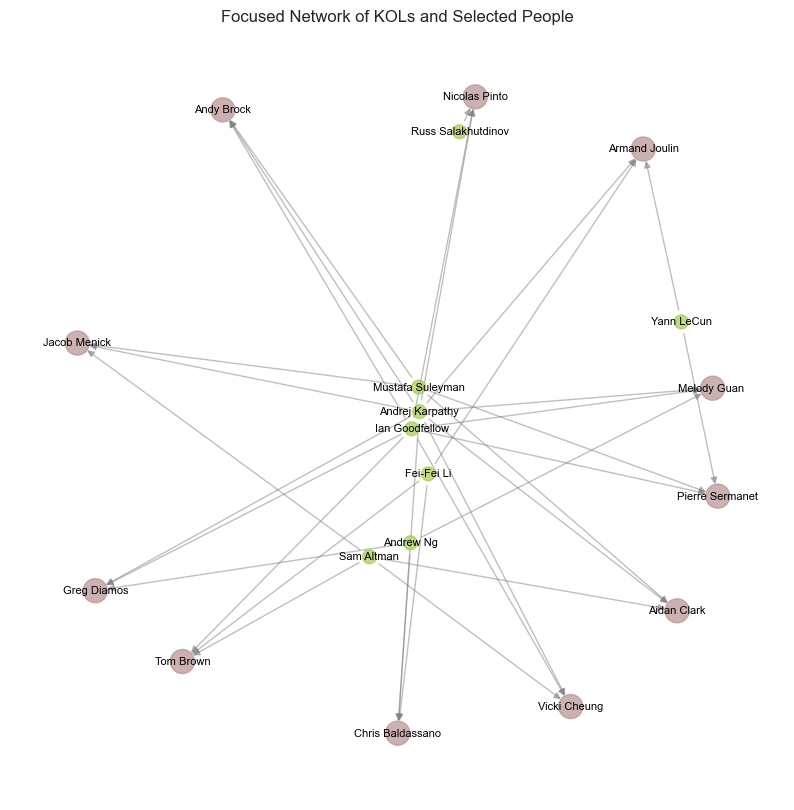

In [71]:
# Initialize a new directed graph
H = nx.DiGraph()

# Add only relevant nodes and edges
for _, row in data_cleaned.iterrows():
    if row['name_fo'] in selected_people['name_fo'].values:
        H.add_edge(row['name_kol'], row['name_fo'])

# Define node colors and sizes based on their role
node_colors = ['#b69190' if node in selected_people['name_fo'].values else '#a6ca50' for node in H.nodes()]
node_sizes = [300 if node in selected_people['name_fo'].values else 100 for node in H.nodes()]

# Visualize the network
plt.figure(figsize=(10, 10))  # Set the figure size
pos = nx.spring_layout(H)  # Node positions

nx.draw_networkx_nodes(H, pos, node_color=node_colors, node_size=node_sizes, alpha=0.7)
nx.draw_networkx_edges(H, pos, edge_color='gray', width=1.0, alpha=0.5)
nx.draw_networkx_labels(H, pos, font_size=8, font_color='black')

plt.title('Focused Network of KOLs and Selected People')
plt.axis('off')  # Hide the axes
plt.show()

In [72]:
selected_people_info = data_cleaned[data_cleaned['name_fo'].isin(selected_people['name_fo'])].drop_duplicates(subset='name_fo').reset_index(drop=True)
selected_people_info

,profileUrl,screenName_fo,userId_fo,name_fo,imgUrl_fo,bio_fo,website_fo,location,location_cleansed,createdAt_fo,...,name_kol,imgUrl_kol,bio_kol,website_kol,location_kol,createdAt_kol,followersCount_kol,friendsCount_kol,tweetsCount_kol,certified_kol
0,https://twitter.com/nottombrown,nottombrown,5.159041e+07,Tom Brown,https://pbs.twimg.com/profile_images/128526677...,"@AnthropicAI, GPT-3, AI alignment, robustness,...",facebook.com/nottombrown,SF,San Francisco,Sat Jun 27 23:31:04 +0000 2009,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
1,https://twitter.com/vmcheung,vmcheung,6.292344e+07,Vicki Cheung,https://pbs.twimg.com/profile_images/116324060...,"CTO @gantry_ml. prev: @lyft, #Kubecon co-chair...",vickicheung.com,"San Francisco, CA",San Francisco,Tue Aug 04 20:46:00 +0000 2009,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
2,https://twitter.com/npinto,npinto,1.693249e+07,Nicolas Pinto,https://pbs.twimg.com/profile_images/155979620...,Stealth Architect AI x Crypto + Arts. ex- Priv...,NaN,"San Francisco, CA",San Francisco,Thu Oct 23 18:37:58 +0000 2008,...,Russ Salakhutdinov,https://pbs.twimg.com/profile_images/550901065...,UPMC Professor of Computer Science at Carnegie...,cs.cmu.edu/~rsalakhu/,"Pittsburgh, PA",Fri Jan 02 05:01:58 +0000 2015,100080.0,139.0,1483.0,1.0
3,https://twitter.com/jacobmenick,jacobmenick,1.034887e+18,Jacob Menick,https://pbs.twimg.com/profile_images/119962415...,Researcher @OpenAI.\nPhD candidate @UCL.\nprev...,NaN,San Francisco,San Francisco,Wed Aug 29 19:34:27 +0000 2018,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
4,https://twitter.com/ChrisBaldassano,ChrisBaldassano,2.374260e+09,Chris Baldassano,https://pbs.twimg.com/profile_images/790918496...,"Assistant Prof in Psychology. Brains, movies, ...",chrisbaldassano.com,"New York, NY",New York,Wed Mar 05 19:36:58 +0000 2014,...,Andrej Karpathy,https://pbs.twimg.com/profile_images/129666729...,"🧑‍🍳. Previously Director of AI @ Tesla, foundi...",karpathy.ai,Stanford,Tue Apr 21 06:49:15 +0000 2009,962447.0,898.0,8617.0,1.0
5,https://twitter.com/armandjoulin,armandjoulin,2.224350e+07,Armand Joulin,https://pbs.twimg.com/profile_images/155592622...,"principal researcher, @googledeepmind. ex dire...",NaN,NaN,NaN,Sat Feb 28 09:38:34 +0000 2009,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
6,https://twitter.com/psermanet,psermanet,9.323697e+17,Pierre Sermanet,https://pbs.twimg.com/profile_images/172196125...,Research scientist at @GoogleDeepMind,sermanet.github.io,NaN,NaN,Sun Nov 19 22:07:23 +0000 2017,...,Yann LeCun,https://pbs.twimg.com/profile_images/148357786...,Professor at NYU. Chief AI Scientist at Meta.\...,yann.lecun.com,New York,Wed Jun 17 16:05:51 +0000 2009,701891.0,713.0,18777.0,1.0
7,https://twitter.com/_aidan_clark_,_aidan_clark_,1.332465e+18,Aidan Clark,https://pbs.twimg.com/profile_images/133247177...,"Research @OpenAI.\nEx: @DeepMind, @BerkeleyDAG...",aidanbclark.com,NaN,NaN,Fri Nov 27 23:23:03 +0000 2020,...,Sam Altman,https://pbs.twimg.com/profile_images/804990434...,AI is cool i guess,blog.samaltman.com,SF,Sun Jul 16 22:01:55 +0000 2006,2826775.0,893.0,6336.0,1.0
8,https://twitter.com/ajmooch,ajmooch,7.823561e+17,Andy Brock,https://pbs.twimg.com/profile_images/104655968...,"Dimensionality Diabolist, Seeker of Optima",NaN,NaN,NaN,Sat Oct 01 23:06:41 +0000 2016,...,Mustafa Suleyman,https://pbs.twimg.com/profile_images/165354289...,"CEO, Microsoft AI | Author: The Coming Wave | ...",the-coming-wave.com,"Palo Alto, CA",Mon Jan 27 22:49:49 +0000 2014,12

Saving figure org_distribution2


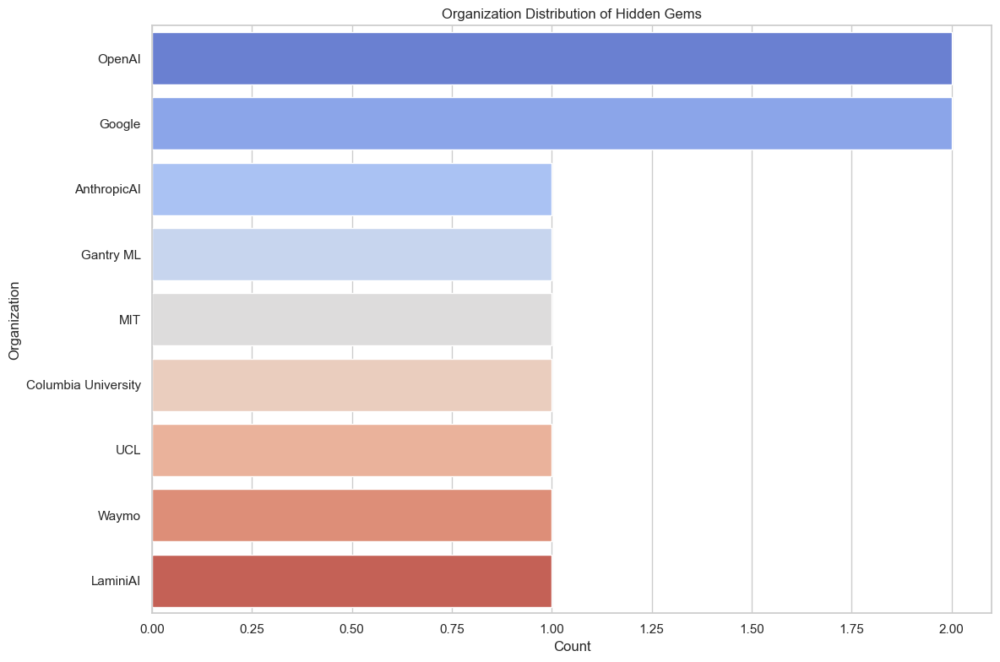

In [73]:
org_cat2 = selected_people_info['highest_level_org'].value_counts()  

plt.figure(figsize=(12, 8))
sns.barplot(x=org_cat2.values, y=org_cat2.index, palette='coolwarm')
plt.title('Organization Distribution of Hidden Gems')
plt.xlabel('Count')
plt.ylabel('Organization')
save_fig('org_distribution2')
plt.show()

### Homophily

In [74]:
founder_executive = data_cleaned2[data_cleaned2['position_categorized_kol'] == 'Founder & Executive']

# Create a directed graph
G8 = nx.DiGraph()

# Add nodes and edges from the DataFrame
for _, row in founder_executive.iterrows():
    if row['ai_related'] == 'Y':
        G8.add_node(row['name_fo'], type=row['position_categorized'])
        G8.add_node(row['name_kol'], type=row['position_categorized_kol'])
        G8.add_edge(row['name_kol'], row['name_fo'], follow_back=row['following_fo'])

In [75]:
def calculate_homophily(graph, attribute):
    # Count same attribute edges and total edges
    same_attr_edges = 0
    total_edges = 0
    
    for u, v in graph.edges():
        total_edges += 1
        if graph.nodes[u][attribute] == graph.nodes[v][attribute]:
            same_attr_edges += 1
    
    # Calculate homophily ratio
    homophily_ratio = same_attr_edges / total_edges if total_edges else 0
    return homophily_ratio


In [76]:
# Calculate homophily based on 'attribute'
homophily_ratio = calculate_homophily(G8, 'type')
print("Homophily Ratio:", homophily_ratio)

Homophily Ratio: 0.2776255707762557


In [77]:
research_scientist = data_cleaned2[data_cleaned2['position_categorized_kol'] == 'Researcher & Scientist']

# Create a directed graph
G9 = nx.DiGraph()

# Add nodes and edges from the DataFrame
for _, row in research_scientist.iterrows():
    if row['ai_related'] == 'Y':
        G9.add_node(row['name_fo'], type=row['position_categorized'])
        G9.add_node(row['name_kol'], type=row['position_categorized_kol'])
        G9.add_edge(row['name_kol'], row['name_fo'], follow_back=row['following_fo'])


In [78]:
# Calculate homophily based on 'attribute'
homophily_ratio2 = calculate_homophily(G9, 'type')
print("Homophily Ratio:", homophily_ratio2)

Homophily Ratio: 0.466903073286052
